# EDA Analysis of CUB 200 2011 dataset

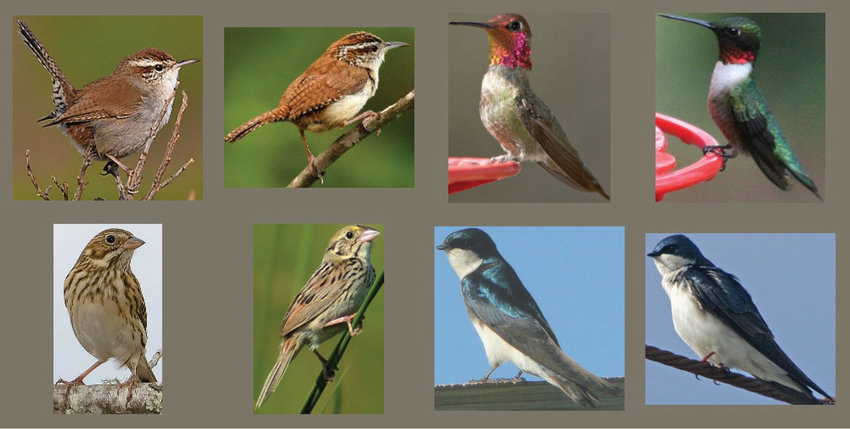

# 1. Importing libraries

In [1]:
import torch
from torchvision import transforms
import os
import numpy as np
import pandas as pd
from nltk.tokenize import RegexpTokenizer
from PIL import Image
from torchvision.utils import make_grid

import seaborn as sns
import os
import time 
import random
import argparse

import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import matplotlib
from torch.cuda.amp import GradScaler, autocast
matplotlib.use('agg')
import matplotlib.pyplot as plt
import pickle
import torch.utils.data as data
from tensorboardX import SummaryWriter
import torchvision.utils as vutils
import warnings
import scipy.misc
import errno
warnings.filterwarnings("ignore") 

# 2. Loading and Analysing dataset

## 2.1 Analysing number of images in each sub-directory

In [2]:
def number_of_images(root_dir):
    '''
    The function will return the number of images present in each 
    subfolder, number of classes and total number of images.
    '''
    path_image = root_dir + '\images'
    
    image_subfolders = os.listdir(path_image)
    img = []
    species = []
    image_count = {}
    for image in image_subfolders:  #listing subfolders
        count = 0
        species.append(image)
        for ele in os.listdir(os.path.join(path_image, image)):  #listing images
            img.append(ele)
            jpg = str.split(ele,'.')
            for name in jpg:
                if name == 'jpg':
                    count=count+1
        image_count[image] = count
        
    return image_count,len(species),len(img)

In [3]:
number_of_bird_each_species, number_species,img_length = number_of_images('birds\CUB_200_2011')

In [4]:
print('Total number of bird species: {}'.format(number_species))
print('Total number of images present: {}'.format(img_length))

Total number of bird species: 200
Total number of images present: 11788


Text(0, 0.5, 'Number of Images')

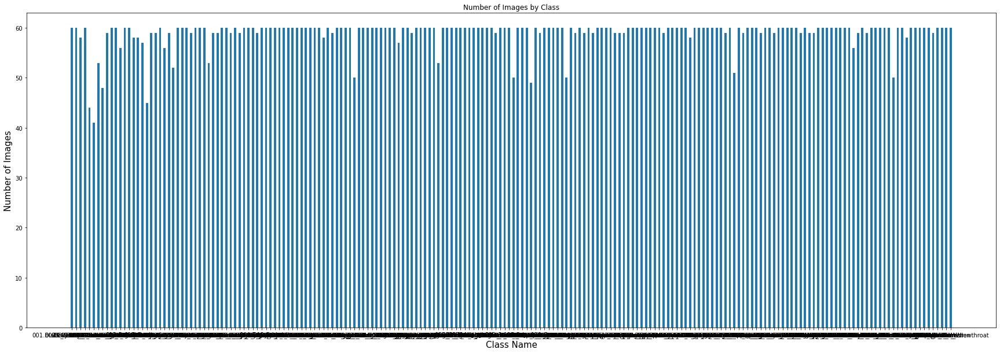

In [5]:
#plotting bar plot
plt.figure(figsize=(30,10))
plt.bar(number_of_bird_each_species.keys(), number_of_bird_each_species.values(), width = .5)
plt.title("Number of Images by Class")
plt.xlabel('Class Name',fontsize=15)
plt.ylabel('Number of Images',fontsize=15)

There are 200 class labels so visualising them on bar plot is somewhat difficult. Let's try another plot

Text(0, 0.5, 'Number of Images')

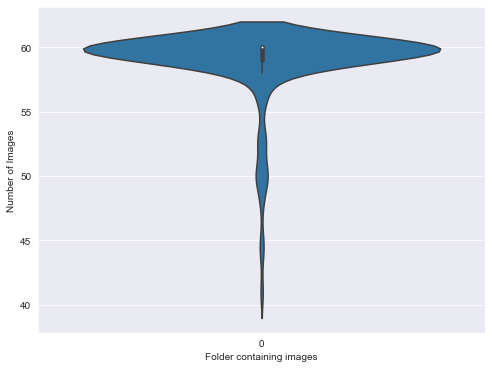

In [35]:
#plotting violinplot
lists = number_of_bird_each_species.items()
x, y = zip(*lists)
plt.figure(figsize=(8,6))
sns.violinplot(data = y)
plt.xlabel('Folder containing images')
plt.ylabel('Number of Images')

Text(0.5, 0, 'Number of Images')

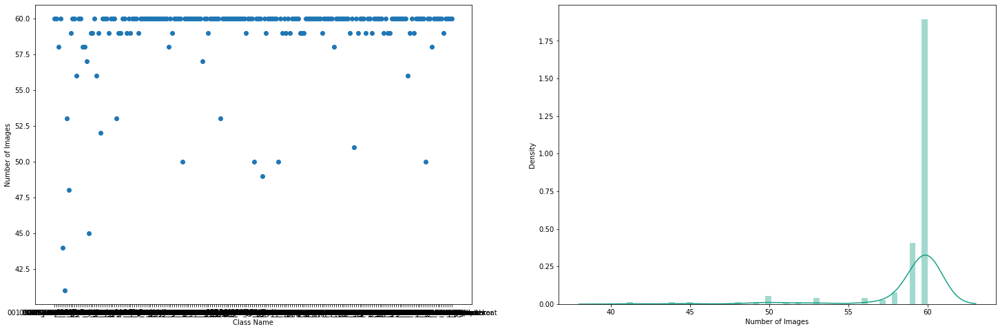

In [6]:
#plotting scatter and distribution plot for number of images in each subfolder

lists = number_of_bird_each_species.items()  #  return a list of tuples

plt.figure(figsize=(25,8))
plt.subplot(121)

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.scatter(x, y)
plt.xlabel('Class Name',fontsize=10)
plt.ylabel('Number of Images',fontsize=10)

plt.subplot(122)
sns.distplot(y, color='#16A085')
plt.xlabel('Number of Images',fontsize=10)

### Observation

1. I can observe that there are mostly 60 images in each subfolder of species.


2. There are some subfolders that contains 59 images.

#### Let's observe at the percentiles

In [45]:
# 0-10 percentile
for i in range(0,11):
    print(i,'Percentile value is',np.percentile(y,i))

0 Percentile value is 41.0
1 Percentile value is 44.99
2 Percentile value is 48.98
3 Percentile value is 50.0
4 Percentile value is 50.0
5 Percentile value is 51.95
6 Percentile value is 53.0
7 Percentile value is 55.790000000000006
8 Percentile value is 56.0
9 Percentile value is 57.0
10 Percentile value is 58.0


I have a folder which contains 41 images in it. the mean value of each sub-folder containing images is 60 and this sub-folder contains comparitively lesser amount of images in it.

In [46]:
# 10-20 percentile
for i in range(0,11):
    print(10+i,'Percentile value is',np.percentile(y,10+i))

10 Percentile value is 58.0
11 Percentile value is 58.0
12 Percentile value is 58.0
13 Percentile value is 59.0
14 Percentile value is 59.0
15 Percentile value is 59.0
16 Percentile value is 59.0
17 Percentile value is 59.0
18 Percentile value is 59.0
19 Percentile value is 59.0
20 Percentile value is 59.0


In [47]:
# 20-30 percentile
for i in range(0,11):
    print(20+i,'Percentile value is',np.percentile(y,20+i))

20 Percentile value is 59.0
21 Percentile value is 59.0
22 Percentile value is 59.0
23 Percentile value is 59.0
24 Percentile value is 59.0
25 Percentile value is 59.0
26 Percentile value is 59.0
27 Percentile value is 59.0
28 Percentile value is 59.720000000000006
29 Percentile value is 60.0
30 Percentile value is 60.0


### Observation


1. Now as we move towards higher percentiles it seems that the value is going to be constant which is 60 in our case.


2. I can conclude from this part that 28% of my sub-folders that are having images less than 60 in them.

#### Let's observe some images of sparrows from different class species

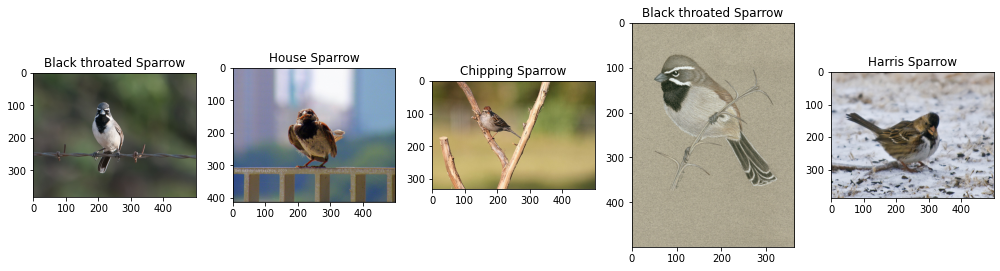

In [7]:
#Source:https://notebooks.githubusercontent.com/view/ipynb?browser=chrome&color_mode=auto&commit=2022ec832137b512324d324129d083f63f6a2188&device=unknown&enc_url=68747470733a2f2f7261772e67697468756275736572636f6e74656e742e636f6d2f736c69706e6974736b6179612f63616c746563682d62697264732d616476616e6365642d636c617373696669636174696f6e2f323032326563383332313337623531323332346433323431323964303833663633663661323138382f6e6f7465626f6f6b2e6970796e62&logged_in=false&nwo=slipnitskaya%2Fcaltech-birds-advanced-classification&path=notebook.ipynb&platform=android&repository_id=306156391&repository_type=Repository&version=98
import random
import matplotlib.image as mpimg

random.seed(42)
in_dir_data = 'birds\CUB_200_2011'
in_dir_img = os.path.join(in_dir_data, 'images')

# obtain classes of sparrow species
img_sparrows = dict()
cls_sparrows_total = [k for k in os.listdir(in_dir_img) if 'sparrow' in k.lower()]

# get images of some sparrow classes 
cls_sparrows = cls_sparrows_total[1::2][:5]
for dirname in cls_sparrows:
    imgs = list()
    for dp, _, fn in os.walk(os.path.join(in_dir_img, dirname)):
        imgs.extend(fn)
    img_sparrows[dirname] = imgs

# visualize randomly-chosen images
n_cls = len(cls_sparrows)
f, ax = plt.subplots(1, n_cls, figsize=(14, 8))

for i in range(n_cls):
    cls_name = cls_sparrows[random.randint(0, n_cls - 1)]
    n_img = len(img_sparrows[cls_name])
    img_name = img_sparrows[cls_name][random.randint(0, n_img - 1)]
    path_img = os.path.join(os.path.join(in_dir_img, cls_name), img_name)
    ax[i].imshow(mpimg.imread(path_img))
    ax[i].set_title(cls_name.split('.')[-1].replace('_', ' '),  fontsize=12)

    plt.tight_layout()
plt.show()

As we can see from the above images that there is a high similarity among the birds and it is really hard to spot the difference between the species of the sparrows.

In [8]:
print(len(cls_sparrows_total))

21


There are total 21 species which are represented by name Sparrow only.

## 2.2 Analysing size of the images

#### Let's see the distribution of heights and widths of images

In [9]:
#making a dictionary which contains subfolder as keys and the corresponding path as values
directories = {}
root_dir = 'birds\CUB_200_2011'

path_image = root_dir + '\images'

image_subfolders = os.listdir(path_image)

for image in image_subfolders:
    
    directories[image] = os.path.join(path_image,image)

In [ ]:
#https://medium.com/geekculture/eda-for-image-classification-dcada9f2567a
from PIL import Image
import dask.bag as db
from dask.diagnostics import ProgressBar
import cv2

def get_dims(file):
    '''Returns dimenstions for an RBG image'''
    im = cv2.imread(file)
    h,w,c = im.shape
    return h,w,c

dimensions = []

for n,d in directories.items():
    filepath = d
    filelist = [filepath + '\\' + f for f in os.listdir(filepath)]
    dims = db.from_sequence(filelist).map(get_dims)
    with ProgressBar():  
        #computing the h,w,c which are stored as a list
        dims = dims.compute()
        for size in dims:
            dimensions.append(size)

In [16]:
#storing h and w of raw images in a dataframe
df = pd.DataFrame(dimensions,columns=['height','width','channels'])
df.drop('channels',axis=1,inplace=True)
df.to_csv('height_width_df.csv',index=False)

In [18]:
h_w_df = pd.read_csv('height_width_df.csv')
h_w_df.head()

,height,width
0,223,320
1,347,500
2,375,500
3,335,500
4,350,350


Text(0, 0.5, 'Pixels')

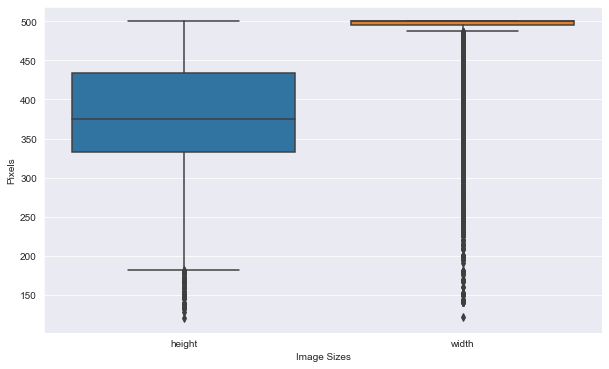

In [19]:
#plotting barplot of height and width of raw images
plt.figure(figsize=(10,6))
sns.boxplot(data = h_w_df)
plt.xlabel('Image Sizes')
plt.ylabel('Pixels')

### Observation

1. I can observe from the above plot that mostly all of the images have width equals to 500 pixels.


2. The height of the images has a considerable large distribution of pixels as compared to width.

#### Let's check the percentile values of the height of images

In [50]:
#25th, 50th and 75th percentile
print('75th Percentile value of height is: ',np.percentile(h_w_df['height'],75))
print('='*50)
print('Mean value of height is: {}'.format(h_w_df['height'].mean()))
print('='*50)
print('25th Percentile value of height is: ',np.percentile(h_w_df['height'],25))

75th Percentile value of height is:  434.0
Mean value of height is: 386.02994570749917
25th Percentile value of height is:  333.0


[0.00067866 0.00127248 0.0018663  0.0023753  0.00254496 0.00339328
 0.00704106 0.00780455 0.01662708 0.01993553 0.03766542 0.27400747
 0.09119444 0.1586359  0.08432304 0.02875806 0.02103834 0.01637258
 0.01476077 0.20970478]
[120. 139. 158. 177. 196. 215. 234. 253. 272. 291. 310. 329. 348. 367.
 386. 405. 424. 443. 462. 481. 500.]


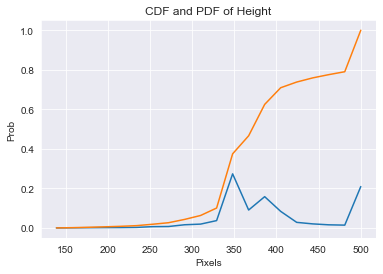

In [21]:
counts, bin_edges = np.histogram(h_w_df['height'], bins=20, density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
sns.set_style('darkgrid')
cdf = np.cumsum(pdf)

#plotting pdf and cdf of heights of raw images.

plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf)
plt.title('CDF and PDF of Height')
plt.xlabel('Pixels')
plt.ylabel('Prob')
plt.show()

### Observation

1. Above plot shows us the cummilative distribution of our images height.


2. Let's take a value on 'X' axis, let's say the value we choose is 400 pixels. When we look at the corresponding 'Y' axis it shows us that 70% of the values of image height falls below 400 pixels. Which means that the 70% of our data contains the images which have heights less than 400 pixels.

#### Multivariate analysis of Heights and Widths

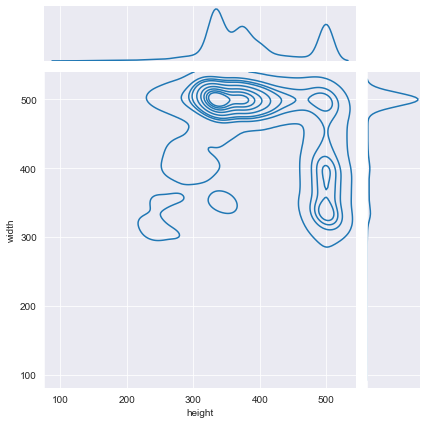

In [22]:
sns.jointplot(x='height',y='width',data=h_w_df,kind='kde')
plt.show()

### Observation

1. From the above plot I can infer that there is a large density of images having image size 333x500 pixels.


2. There is a large distribution of image heights falling under 300 - 400 pixel range and mostly image widths are falling under 500 pixels.


## 2.3 Analysing Bounding Boxes

In [19]:
#reading bounding box text file and converting it to a dataframe
# read in column labels as list
cols = pd.read_csv('birds/CUB_200_2011/bounding_boxes.txt', nrows=0).columns.tolist()
splitted_cols = np.array(cols[0].split(' ')).reshape(1,-1)
df1 = pd.DataFrame(splitted_cols,columns=['ID','center_x','center_y','height','width'])

# read in data and remove first row
data = pd.read_csv('birds/CUB_200_2011/bounding_boxes.txt',header=None, skiprows=[0])
x = list(data[0].apply(lambda x: x.split(' ')))
df_list = []
for i in x:
    df_list.append(i)

df2 = pd.DataFrame(df_list,columns=['ID','center_x','center_y','height','width'])
bb_df = pd.concat([df1,df2]).reset_index(drop = True)
bb_df = bb_df.astype({'ID': int})
bb_df.head()

,ID,center_x,center_y,height,width
0,1,60.0,27.0,325.0,304.0
1,2,139.0,30.0,153.0,264.0
2,3,14.0,112.0,388.0,186.0
3,4,112.0,90.0,255.0,242.0
4,5,70.0,50.0,134.0,303.0


In [28]:
#combining the images text file with bounding box text file as a dataframe

pic_cols = pd.read_csv('birds/CUB_200_2011/images.txt', nrows=0).columns.tolist()
pic_splitted_cols = np.array(pic_cols[0].split(' ')).reshape(1,-1)
pic_df1 = pd.DataFrame(pic_splitted_cols,columns=['ID','image_path'])

pic_data = pd.read_csv('birds/CUB_200_2011/images.txt',header=None, skiprows=[0])
x_pic = list(pic_data[0].apply(lambda x: x.split(' ')))
pic_df_list = []
for j in x_pic:
    pic_df_list.append(j)
pic_df2 = pd.DataFrame(pic_df_list,columns=['ID','image_path'])
pic_bb_df = pd.concat([pic_df1,pic_df2]).reset_index(drop = True)
pic_bb_df = pic_bb_df.astype({'ID': int})

final_bb_data = pd.merge(pic_bb_df,bb_df,on='ID',how='left')
final_bb_data.head()

,ID,image_path,center_x,center_y,height,width
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,60.0,27.0,325.0,304.0
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...,139.0,30.0,153.0,264.0
2,3,001.Black_footed_Albatross/Black_Footed_Albatr...,14.0,112.0,388.0,186.0
3,4,001.Black_footed_Albatross/Black_Footed_Albatr...,112.0,90.0,255.0,242.0
4,5,001.Black_footed_Albatross/Black_Footed_Albatr...,70.0,50.0,134.0,303.0


In [316]:
#lets visualise any three of the images

def show_image(data,number):
    '''
    The function will plot the raw images from the dataset
    '''
    sample_images = 'birds/CUB_200_2011/images/' + data['image_path'][number]
    fig, ax = plt.subplots()
    #reading image
    img = cv2.imread(sample_images)

    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    ax.xaxis.tick_top()
    ax.imshow(img)
    
def show_boxes(data,number):
    '''
    The function will plot the bounding boxes on raw images from the dataset
    '''
    
    sample_images = 'birds/CUB_200_2011/images/' + data['image_path'][number]
    img = cv2.imread(sample_images)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    
    #getting the coordinates from the final_bb_data
    pt1 = int(float(data.center_x[number]))
    pt2 =  int(float(data.center_y[number]))
    h = int(float(data.height[number]))
    w = int(float(data.width[number]))

    fig, ax = plt.subplots(figsize = (6,9))
    ax.xaxis.tick_top()
    ax.imshow(img)
    #adding bounding box from coordinates
    ax.add_patch(matplotlib.patches.Rectangle((pt1,pt2),h,w, fill=False, edgecolor='red', lw=2))  

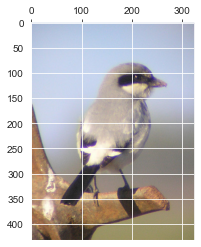

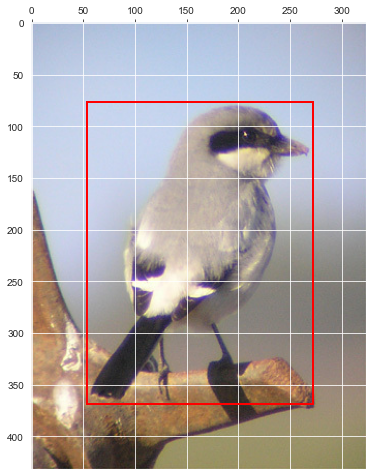

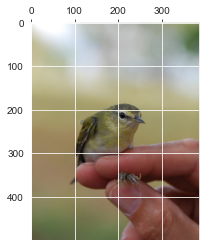

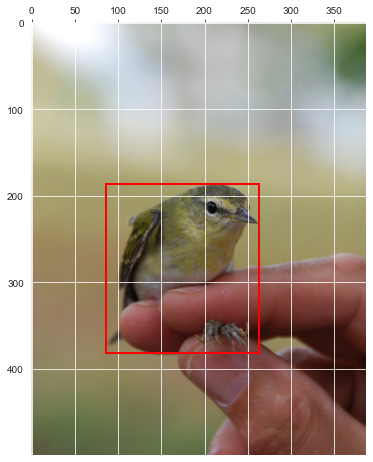

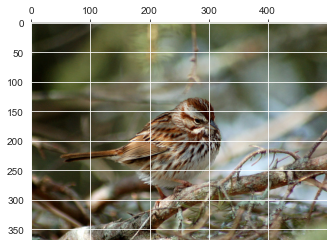

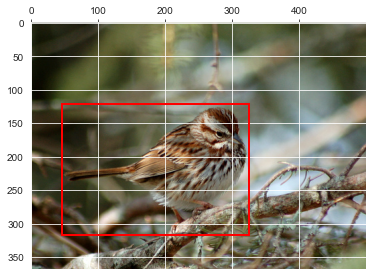

In [298]:
#randomly plotting any 3 images with bounding boxes
randomlist = random.sample(range(1, 11788), 3)
for r in randomlist:
    show_image(final_bb_data,r)
    show_boxes(final_bb_data,r)

### Checking distribution of Height, Width, Center X, and Center Y

Text(0.5, 0, 'Width sizes')

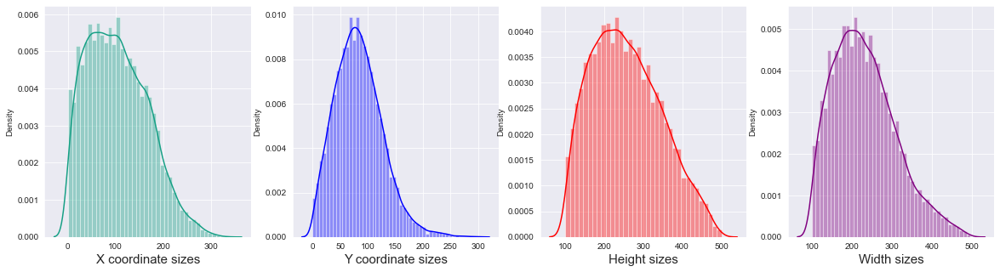

In [279]:
#plotting distribution plot of h,w, x coordinate and y coordinate
plt.figure(figsize=(20,5))
plt.subplot(141)
sns.distplot(bb_df.center_x, color='#16A085')
plt.xlabel('X coordinate sizes',fontsize=15)
plt.subplot(142)
sns.distplot(bb_df.center_y, color='blue')
plt.xlabel('Y coordinate sizes',fontsize=15)
plt.subplot(143)
sns.distplot(bb_df.height, color='red')
plt.xlabel('Height sizes',fontsize=15)
plt.subplot(144)
sns.distplot(bb_df.width, color='purple')
plt.xlabel('Width sizes',fontsize=15)

1. Above plot shows that the height and width sizes of the bounding boxes are larger in value than X and Y coordinate values.


2. Variance of X-coordinates, Height and Width are wider than Y coordinate variance.

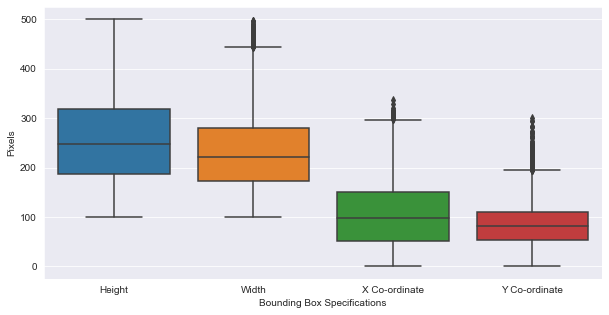

In [297]:
#plotting box plot of h, w, x coordinate and y coordinate
plt.figure(figsize=(10,5))
sns.boxplot(data = [bb_df.height,bb_df.width,bb_df.center_x,bb_df.center_y])
plt.xticks([0,1, 2, 3], ['Height', 'Width', 'X Co-ordinate','Y Co-ordinate'])
plt.xlabel('Bounding Box Specifications')
plt.ylabel('Pixels')
plt.show()

1. I have plotted the box plots in descending order based on the size of each specification.


2. I can observe here that there is a region values where heights and widths overlap with each other and hence they might be equal in ratio. 

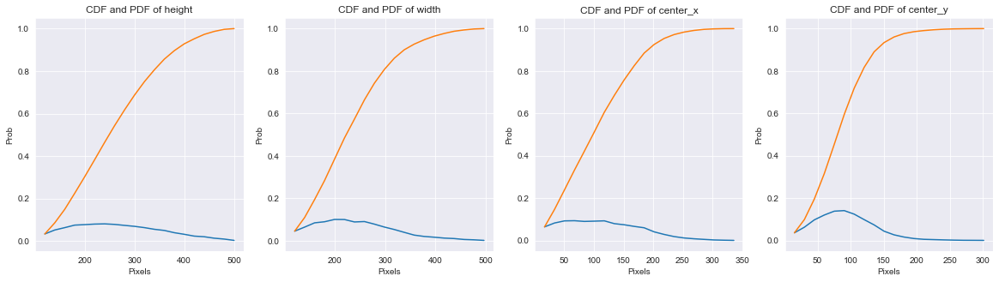

In [315]:
def cdf_pdf(data,speci):
    '''
    The function will plot the CDF and PDF of bounding
    box specifications.
    '''
    counts, bin_edges = np.histogram(data[speci].astype('float'), bins=20, density = True)
    pdf = counts/(sum(counts))
    sns.set_style('darkgrid')
    cdf = np.cumsum(pdf)

    #plotting pdf and cdf

    plt.plot(bin_edges[1:],pdf)
    plt.plot(bin_edges[1:], cdf)
    plt.title('CDF and PDF of ' + speci)
    plt.xlabel('Pixels')
    plt.ylabel('Prob')

#plotting all specifications
plt.figure(figsize=(20,5))
plt.subplot(141)
cdf_pdf(bb_df,'height')
plt.subplot(142)
cdf_pdf(bb_df,'width')
plt.subplot(143)
cdf_pdf(bb_df,'center_x')
plt.subplot(144)
cdf_pdf(bb_df,'center_y')

1. CDF of center_y is plateaued early than other specifications which means that at higher percentiles the value of pixels is going to be same.


2. The CDF of Height has more variation and at higher percentiles the curve is not plateauing than the other curves.

## 2.4 EDA Summary

1. There are some folders which contains images less than 60 in number and having less amount of data is not good for training models. In this case the folder which is having the lowest number of images contains 41 images. This number is not bad and hence can be considered for training.


2. Mostly raw images have width of 500 pixels which is a good thing because we are able to see a constant pixel value for widths. On the other hand there is a large distribution of pixel values for heights of images but we can take care of the heights and widths at later stages during pre-processing of images.


3. Most of the images have their ratios as 333x500 pixels.


4. Bounding boxes have height and width pixels smaller than raw images. The sizes of height of the bounding boxes are larger than other measurements and also there are possibilities of having a sqaure ratio bounding box as height and width measurements are overlapping. 

# 3. Implementing StackGAN: Text to Photo-realistic Image Synthesis with Stacked Generative Adversarial Networks paper on CUB-200-2011 dataset

## 3.1 Loading data and Pre - Processing

In [2]:
class BirdDataset(data.Dataset):
    def __init__(self, dataDir, split='train', imgSize=64, transform=None):
        super(BirdDataset,self).__init__()
        self.transform = transform
        self.norm = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
        self.imgSize = imgSize
        self.dataDir = dataDir
        self.filenames, self.caps = self.load_info(dataDir, split)
        self.bbox = self.load_bbox()
        self.classes = self.load_class(dataDir, split)
              
    def load_info(self, dataDir, split):
        filenames = self.load_filenames(dataDir, split)
        captionFile = os.path.join(dataDir, 'birds', split, 'char-CNN-RNN-embeddings.pickle')
        with open (captionFile, 'rb') as f:
            captions = pickle.load(f,encoding='latin1')
            captions = np.array(captions)
            print('captions shape: ', captions.shape)
        
        return filenames, captions
        
    def load_filenames(self, dataDir, split):
        path = os.path.join(dataDir, 'birds', split, 'filenames.pickle')
        with open(path, 'rb') as f:
            filenames = pickle.load(f,encoding='latin1')
        print('Load filenames from: %s (%d)' % (path, len(filenames)))
        return filenames
    
    def load_bbox(self):
        path = os.path.join(self.dataDir,'birds','CUB_200_2011', 'bounding_boxes.txt')
        bbox_data = pd.read_csv(path, delim_whitespace=True, header=None).astype(int)

        filepath = os.path.join(self.dataDir,'birds', 'CUB_200_2011','images.txt')
        df_filenames = pd.read_csv(filepath, delim_whitespace=True, header=None)
        filenames = sorted( list(df_filenames[1]))
        fname_bbox_dict = {x[:-4]:[] for x in filenames} # use filename without '.jpg' extension as a key
        for i in range(len(filenames)):
            data = list(bbox_data.iloc[1][1:])
            k = filenames[i][:-4]
            fname_bbox_dict[k] = data
        return fname_bbox_dict
    
    def load_class(self, dataDir, split):
        path = os.path.join(dataDir, 'birds', split, 'class_info.pickle')
        if os.path.isfile(path):
            with open(path, 'rb') as f:
                classId = pickle.load(f,encoding='latin1')
        else:
            classId = np.arange(len(self.filenames))
        return classId

    def get_img(self, img_path, bbox=None):
        img = Image.open(img_path).convert('RGB')
        width, height = img.size
        if bbox is not None:
            R = int(np.maximum(bbox[2], bbox[3]) * 0.75)
            center_x = int((2 * bbox[0] + bbox[2]) / 2)
            center_y = int((2 * bbox[1] + bbox[3]) / 2)
            y1 = np.maximum(0, center_y - R)
            y2 = np.minimum(height, center_y + R)
            x1 = np.maximum(0, center_x - R)
            x2 = np.minimum(width, center_x + R)
            img = img.crop([x1, y1, x2, y2])
        load_size = int(self.imgSize * 76 / 64)
        img = img.resize((load_size, load_size), Image.BILINEAR)
        if self.transform is not None:
            img = self.transform(img)
        return img

    
    def __getitem__(self, idx):
        key = self.filenames[idx]
        
        if self.bbox is not None:
            bbox = self.bbox[key]
        else:
            bbox = None
        emb = self.caps[idx, :, :]
        imagePath = os.path.join(self.dataDir,'birds', 'CUB_200_2011', 'images',self.filenames[idx]+'.jpg')
        image = self.get_img(imagePath, bbox)
        
        # random select a sentence
        sample = np.random.randint(0, emb.shape[0]-1)
        cap = emb[sample, :]
        return image, cap
    
    def __len__(self):
        return len(self.filenames)

# 4. Model Creation

## 4.1 Stage 1 GAN

### Building Conditioning Augmentation model and  Stage - 1 Generator

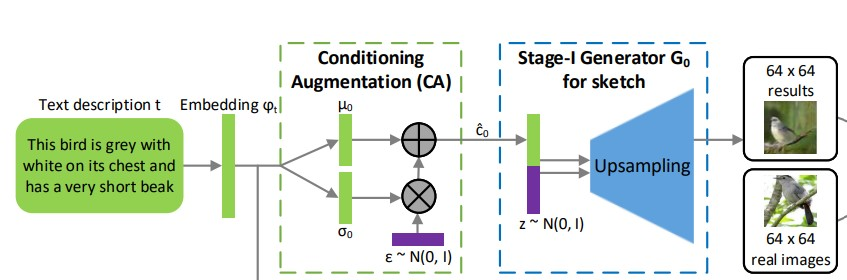

For the generator G0, to obtain text conditioning variable c, the text embedding ϕt is first fed into a fully connected layer to generate µ0 and σ0 (σ0 are the values in the diagonal of Σ0) for the Gaussian distribution N (µ0(ϕt), Σ0(ϕt)). Variable c are then sampled from the Gaussian distribution.



Our Ng dimensional conditioning vector c is computed by c = µ0 + σ0 * ε (where * is the element-wise multiplication, ε ∼ N (0, I)). Then, c is concatenated with a Nz dimensional noise vector to generate a W0 × H0 image by a series of up-sampling blocks.

In [3]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
        
CUDA = True
cond_dim = 128
df_dim = 128
gf_dim = 128
z_dim = 100
emb_dim = 1024

def Conv_k3(in_p, out_p, stride=1):
    return nn.Conv2d(in_p, out_p, kernel_size=3, stride=stride, padding=1, bias=False)

class Upblock(nn.Module):
    def __init__(self, inp, outp):
        super(Upblock, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='nearest')
        self.conv = Conv_k3(inp, outp)
        self.batch = nn.BatchNorm2d(outp)
        self.relu = nn.ReLU(True)
        
    def forward(self, x):
        o = self.up(x)
        o = self.relu(self.conv(o))
        o = self.batch(o)
        return o

class D_output(nn.Module):
    def __init__(self, have_cond = True):
        super(D_output, self).__init__()
        self.have_cond = have_cond
        self.classifier = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=1, kernel_size=4, stride=4),
            nn.Sigmoid()
        )
        if have_cond:
            cond_part = nn.Sequential(
                Conv_k3(in_p=1024+128, out_p=1024),
                nn.BatchNorm2d(1024),
                nn.LeakyReLU(0.2, inplace=True),
            )
            self.classifier = torch.nn.Sequential(*(list(cond_part)+list(self.classifier)))
        print(self.classifier)
            
    def forward(self, encoded_image, encoded_cond=None):
        if self.have_cond and encoded_cond is not None:
            cond = encoded_cond.view(-1, 128 , 1, 1)
            cond = cond.repeat(1, 1, 4, 4)
            image_with_cond = torch.cat((encoded_image, cond), 1)
        else:
            image_with_cond = encoded_image
        return self.classifier(image_with_cond).view(-1)

class CondAugment_Model(nn.Module):
    def __init__(self):
        super(CondAugment_Model,self).__init__()
        self.fc = nn.Linear(in_features=emb_dim, out_features=cond_dim*2)
        self.relu = nn.ReLU(True)
        
    def convert(self, embed):
        x = self.relu(self.fc(embed))
        mean, sigma = x[:, : cond_dim], x[:, cond_dim:]
        return mean, sigma
    
    def forward(self, x):
        mean, sigma = self.convert(x)
        diag = torch.exp(sigma*0.5)
        if CUDA:
            normal_dis = (torch.FloatTensor(diag.size()).normal_()).cuda()
        else:
            normal_dis = (torch.FloatTensor(diag.size()).normal_())
        condition = (diag*normal_dis)+mean
        return condition, mean, sigma

In [4]:
        
class G_Stage1(nn.Module):
    def __init__(self):
        super(G_Stage1, self).__init__()
        self.CA = CondAugment_Model()
        self.fc = nn.Sequential(
            nn.Linear(in_features=228, out_features=128*8*4*4, bias=False),
            nn.BatchNorm1d(128*8*4*4),
            nn.ReLU(inplace=True)
        )
        self.img = nn.Sequential(
            Upblock(128*8,64*8),
            Upblock(64*8,32*8),
            Upblock(32*8,16*8),
            Upblock(16*8,8*8),
            Conv_k3(8*8, 3),
            nn.Tanh()
        )
        
    def forward(self, noise, emb):
        cond, mean, sigma = self.CA(emb)
        cond = cond.view(noise.size(0), cond_dim, 1, 1)
        x = torch.cat((noise, cond),1)
        x = x.view(-1, 228)
        o = self.fc(x)
        h_code = o.view(-1, 128*8, 4, 4)
        fake_img = self.img(h_code)
        return fake_img, mean, sigma

### Building  Stage - 1 Discriminator

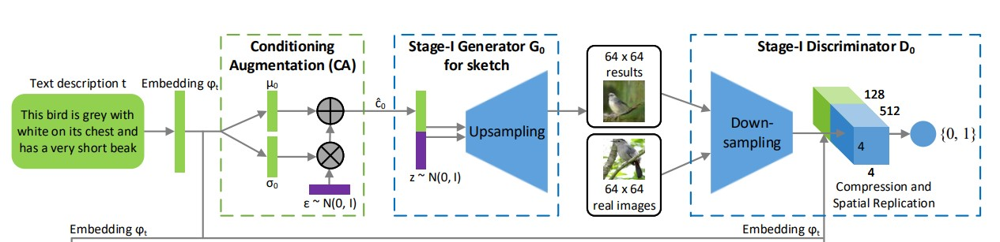

For the discriminator D0, the text embedding ϕt is first compressed to Nd dimensions using a fully-connected layer and then spatially replicated to form a Md × Md × Nd tensor. Meanwhile, the image is fed through a series of down-sampling blocks until it has Md × Md spatial dimension. Then, the image filter map is concatenated along the channel dimension with the text tensor. The resulting tensor is further fed to a 1×1 convolutional layer to jointly learn features across the image and the text. Finally, a fullyconnected layer with one node is used to produce the decision score.

In [5]:
class D_Stage1(nn.Module):
    def __init__(self):
        super(D_Stage1, self).__init__()
        self.encoder = nn.Sequential(
            #c alucalation output size = [(input_size −Kernal +2Padding )/Stride ]+1
            # input is image 3 x 64 x 64  
            nn.Conv2d(in_channels=3, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),# => 128 x 32 x 32 
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),# => 256 x 16 x 16
            
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),# => 512 x 8 x 8
            
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True)# => 1024 x 4 x 4
        )
        self.condition_classifier = D_output()
        self.uncondition_classifier = None
        
    def forward(self, image):
        return self.encoder(image)

### Building Loss Function

Let ϕt be the text embedding of the given description,which is generated by a pre-trained encoder in this paper. The Gaussian conditioning variables c for text embedding are sampled from N (µ0(ϕt), Σ0(ϕt)) to capture the meaning of ϕt with variations. Conditioned on c and random variable z, Stage-I GAN trains the discriminator D0 and the generator G0 by alternatively maximizing LD0 in Eq. (3) and minimizing LG0 in Eq. (4):




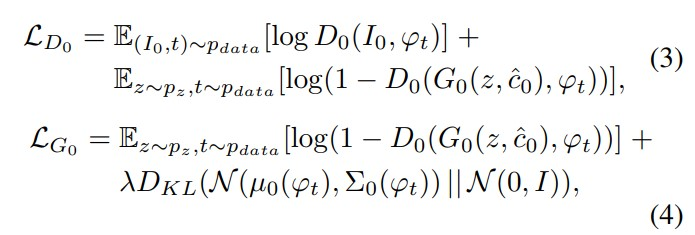

In [6]:
def KL_loss(mean, sigma):
        temp = 1+sigma+((-1)*((mean*mean)+sigma))
        return torch.mean(temp)*(-0.5)

def cal_G_loss(netD, fake_imgs, real_labels, cond):
    criterion = nn.BCELoss()
    cond = cond.detach()
    fake_f = netD(fake_imgs)

    fake_cond_ouput = netD.condition_classifier(fake_f, cond)
    errD_fake = criterion(fake_cond_ouput, real_labels)
    if netD.uncondition_classifier is not None:
        fake_uncond_output = netD.uncondition_classifier(fake_f)
        uncond_errD_fake = criterion(fake_uncond_output, real_labels)
        errD_fake += uncond_errD_fake
    return errD_fake

def cal_D_loss(netD, real_imgs, fake_imgs, real_labels, fake_labels, cond):
    criterion = nn.BCELoss()
    batch_size = real_imgs.size(0)
    cond = cond.detach()
    fake = fake_imgs.detach()

    real_img_feature = netD(real_imgs)
    fake_img_feature = netD(fake)

    real_output = netD.condition_classifier(real_img_feature, cond)
    errD_real  = criterion(real_output, real_labels)
    wrong_output = netD.condition_classifier(real_img_feature[:(batch_size-1)], cond[1:])
    errD_wrong = criterion(wrong_output, fake_labels[1:])

    fake_output = netD.condition_classifier(fake_img_feature, cond)
    errD_fake= criterion(fake_output, fake_labels)

    if netD.uncondition_classifier is not None:
        real_uncond_output = netD.uncondition_classifier(real_img_feature)
        errD_real_uncond = criterion(real_uncond_output, real_labels)

        fake_uncond_output = netD.uncondition_classifier(fake_img_feature)
        errD_fake_uncond = criterion(fake_uncond_output, fake_labels)

        errD = (errD_real+errD_real_uncond)/2. + (errD_fake+errD_wrong+errD_fake_uncond)/3.
        errD_real =  (errD_real+errD_real_uncond)/2
        errD_fake = (errD_fake+errD_fake_uncond)/2.
    else:
        errD = errD_real + (errD_fake+errD_wrong)*0.5
    return errD, errD_real.item(), errD_wrong.item(), errD_fake.item()

### Training Stage - 1 GAN

In [5]:
#https://github.com/donnaphat-ut/StackGAN
    
def main():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    batch_size = 64
    transform = transforms.Compose([
                transforms.RandomCrop(64),
                transforms.RandomHorizontalFlip(),
                transforms.ToTensor(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    
    writer = SummaryWriter('runs/Stage-I')

    dataset = BirdDataset(dataDir = 'Data/', split='train', transform=transform)
    tr_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)
    netG = G_Stage1().to(device)
    netG.apply(weights_init)
    netD = D_Stage1().to(device)
    netD.apply(weights_init)
    lr = 0.0002
    optD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
    optG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

    fixed_noise = torch.rand(batch_size, z_dim, 1, 1).to(device)

    real_labels = (torch.FloatTensor(batch_size).fill_(1)).to(device)
    fake_labels = (torch.FloatTensor(batch_size).fill_(0)).to(device)
    
    if not (os.path.isdir('results1/')):
        os.makedirs(imageDir)
    num_epoch = 600
    iters = 0
    for epoch in range(num_epoch):
        if epoch % 100 == 0 and epoch > 0:
            lr = lr*0.5
            for param_group in optG.param_groups:
                param_group['lr'] = lr
            for param_group in optD.param_groups:
                param_group['lr'] = lr
        for i, data in enumerate(tr_loader,0):
            real_imgs, encoded_caps = data
            real_imgs = real_imgs.to(device)
            encoded_caps = encoded_caps.to(device)

            ##update discriminator
            netD.zero_grad()
            # generate fake image
            noise = torch.rand(batch_size, z_dim, 1, 1).to(device)
            fake_imgs, m, s = netG(noise, encoded_caps)
            errD, errD_real, errD_wrong, errD_fake = cal_D_loss(netD, real_imgs, fake_imgs, real_labels, fake_labels, m)
            errD.backward()
            optD.step()

            ##update generator
            netG.zero_grad()
            errG = cal_G_loss(netD, fake_imgs, real_labels, m)
            errG += errG + KL_loss(m,s)
            errG.backward()
            optG.step()
            
            iters+=1
            
            writer.add_scalar("gen_loss",errG,epoch)
            writer.add_scalar("disc_loss",errD,epoch)

            if i%50 == 0:
                 print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tLoss_D_R: %.4f\tLoss_D_W: %.4f\tLoss_D_F %.4f'
                      % (epoch, num_epoch, i, len(tr_loader),
                         errD.item(), errG.item(), errD_real, errD_wrong, errD_fake))
        if epoch%50==0:
            with torch.no_grad():
                fake, _, _  = netG(fixed_noise, encoded_caps)
                fig = plt.figure(figsize=(10,10))
                grid = make_grid(fake.detach().cpu(), nrow=8, normalize=True).permute(1,2,0).numpy()
                plt.imshow(grid)
                writer.add_image("fake",vutils.make_grid(fake[:64],normalize=True),epoch)
                fig.savefig('results1/epch-{}.png'.format(epoch))

    torch.save(netG.state_dict(), 'results1/netG_epoch_600.pth')
    torch.save(netD.state_dict(), 'results1/netD_epoch_last.pth')
    
if __name__ == '__main__':
    main()

Load filenames from: Data/birds/train/filenames.pickle (8855)
captions shape:  (8855, 10, 1024)
Sequential(
  (0): Conv2d(1152, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): LeakyReLU(negative_slope=0.2, inplace=True)
  (3): Conv2d(1024, 1, kernel_size=(4, 4), stride=(4, 4))
  (4): Sigmoid()
)


/tmp/ipykernel_1630/2994853336.py:67: DeprecationWarning: BILINEAR is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BILINEAR instead.
  img = img.resize((load_size, load_size), Image.BILINEAR)


[0/600][0/138]	Loss_D: 1.7469	Loss_G: 16.0921	Loss_D_R: 0.8459	Loss_D_W: 0.9544	Loss_D_F 0.8476
[0/600][50/138]	Loss_D: 1.6912	Loss_G: 9.2070	Loss_D_R: 0.2201	Loss_D_W: 2.3807	Loss_D_F 0.5615
[0/600][100/138]	Loss_D: 1.6000	Loss_G: 2.1129	Loss_D_R: 1.1358	Loss_D_W: 0.6927	Loss_D_F 0.2356
[1/600][0/138]	Loss_D: 1.5372	Loss_G: 3.1425	Loss_D_R: 0.8087	Loss_D_W: 1.0162	Loss_D_F 0.4409
[1/600][50/138]	Loss_D: 1.5148	Loss_G: 4.2407	Loss_D_R: 0.3971	Loss_D_W: 1.3354	Loss_D_F 0.9001
[1/600][100/138]	Loss_D: 1.7479	Loss_G: 5.7778	Loss_D_R: 0.1809	Loss_D_W: 2.1357	Loss_D_F 0.9982
[2/600][0/138]	Loss_D: 1.2570	Loss_G: 3.0817	Loss_D_R: 0.6023	Loss_D_W: 0.9262	Loss_D_F 0.3832
[2/600][50/138]	Loss_D: 1.3530	Loss_G: 2.5562	Loss_D_R: 0.6324	Loss_D_W: 0.8367	Loss_D_F 0.6044
[2/600][100/138]	Loss_D: 1.4263	Loss_G: 3.2519	Loss_D_R: 0.7299	Loss_D_W: 0.7655	Loss_D_F 0.6273
[3/600][0/138]	Loss_D: 1.4489	Loss_G: 1.8519	Loss_D_R: 0.6451	Loss_D_W: 0.8907	Loss_D_F 0.7170
[3/600][50/138]	Loss_D: 1.6126	Loss_G: 5

[28/600][50/138]	Loss_D: 1.0775	Loss_G: 2.3381	Loss_D_R: 0.3654	Loss_D_W: 0.2195	Loss_D_F 1.2048
[28/600][100/138]	Loss_D: 0.9950	Loss_G: 3.1457	Loss_D_R: 0.1949	Loss_D_W: 0.5660	Loss_D_F 1.0342
[29/600][0/138]	Loss_D: 1.1752	Loss_G: 2.6912	Loss_D_R: 0.5469	Loss_D_W: 0.4225	Loss_D_F 0.8341
[29/600][50/138]	Loss_D: 0.6726	Loss_G: 2.0752	Loss_D_R: 0.3927	Loss_D_W: 0.0921	Loss_D_F 0.4675
[29/600][100/138]	Loss_D: 1.2376	Loss_G: 5.4672	Loss_D_R: 0.0814	Loss_D_W: 0.9635	Loss_D_F 1.3489
[30/600][0/138]	Loss_D: 1.0350	Loss_G: 1.0830	Loss_D_R: 0.8457	Loss_D_W: 0.0924	Loss_D_F 0.2862
[30/600][50/138]	Loss_D: 1.3519	Loss_G: -0.0381	Loss_D_R: 1.1245	Loss_D_W: 0.0690	Loss_D_F 0.3857
[30/600][100/138]	Loss_D: 0.9735	Loss_G: 0.7201	Loss_D_R: 0.6256	Loss_D_W: 0.1084	Loss_D_F 0.5875
[31/600][0/138]	Loss_D: 0.6576	Loss_G: 2.6445	Loss_D_R: 0.2191	Loss_D_W: 0.2000	Loss_D_F 0.6771
[31/600][50/138]	Loss_D: 0.9059	Loss_G: 1.5924	Loss_D_R: 0.2009	Loss_D_W: 0.3954	Loss_D_F 1.0146
[31/600][100/138]	Loss_D: 1.1

[56/600][100/138]	Loss_D: 0.7036	Loss_G: 2.8129	Loss_D_R: 0.2496	Loss_D_W: 0.1657	Loss_D_F 0.7423
[57/600][0/138]	Loss_D: 1.0670	Loss_G: -0.0091	Loss_D_R: 0.9333	Loss_D_W: 0.0570	Loss_D_F 0.2104
[57/600][50/138]	Loss_D: 0.4098	Loss_G: 3.7276	Loss_D_R: 0.2174	Loss_D_W: 0.1089	Loss_D_F 0.2758
[57/600][100/138]	Loss_D: 0.5038	Loss_G: 2.1616	Loss_D_R: 0.2015	Loss_D_W: 0.0214	Loss_D_F 0.5832
[58/600][0/138]	Loss_D: 0.5191	Loss_G: 4.5349	Loss_D_R: 0.1452	Loss_D_W: 0.1473	Loss_D_F 0.6004
[58/600][50/138]	Loss_D: 0.6462	Loss_G: 1.6751	Loss_D_R: 0.3967	Loss_D_W: 0.0271	Loss_D_F 0.4718
[58/600][100/138]	Loss_D: 1.0874	Loss_G: 6.0641	Loss_D_R: 0.0123	Loss_D_W: 0.4195	Loss_D_F 1.7305
[59/600][0/138]	Loss_D: 0.6702	Loss_G: 6.0662	Loss_D_R: 0.0611	Loss_D_W: 0.2252	Loss_D_F 0.9929
[59/600][50/138]	Loss_D: 0.5404	Loss_G: 3.0994	Loss_D_R: 0.2847	Loss_D_W: 0.1156	Loss_D_F 0.3959
[59/600][100/138]	Loss_D: 0.7745	Loss_G: 6.6581	Loss_D_R: 0.0320	Loss_D_W: 0.1057	Loss_D_F 1.3793
[60/600][0/138]	Loss_D: 1.38

[85/600][0/138]	Loss_D: 0.8286	Loss_G: 10.7158	Loss_D_R: 0.0125	Loss_D_W: 0.3913	Loss_D_F 1.2407
[85/600][50/138]	Loss_D: 0.3958	Loss_G: 3.4747	Loss_D_R: 0.1410	Loss_D_W: 0.0022	Loss_D_F 0.5074
[85/600][100/138]	Loss_D: 0.8587	Loss_G: 0.8348	Loss_D_R: 0.8205	Loss_D_W: 0.0199	Loss_D_F 0.0565
[86/600][0/138]	Loss_D: 0.2613	Loss_G: 3.9254	Loss_D_R: 0.1328	Loss_D_W: 0.0142	Loss_D_F 0.2428
[86/600][50/138]	Loss_D: 0.4350	Loss_G: 6.3017	Loss_D_R: 0.0527	Loss_D_W: 0.1375	Loss_D_F 0.6270
[86/600][100/138]	Loss_D: 0.5227	Loss_G: 1.4758	Loss_D_R: 0.3681	Loss_D_W: 0.0397	Loss_D_F 0.2697
[87/600][0/138]	Loss_D: 0.3100	Loss_G: 8.8665	Loss_D_R: 0.2776	Loss_D_W: 0.0515	Loss_D_F 0.0132
[87/600][50/138]	Loss_D: 0.3303	Loss_G: 5.2449	Loss_D_R: 0.0564	Loss_D_W: 0.1604	Loss_D_F 0.3872
[87/600][100/138]	Loss_D: 0.3041	Loss_G: 7.7406	Loss_D_R: 0.0440	Loss_D_W: 0.0254	Loss_D_F 0.4949
[88/600][0/138]	Loss_D: 0.4448	Loss_G: 1.8898	Loss_D_R: 0.2649	Loss_D_W: 0.0075	Loss_D_F 0.3523
[88/600][50/138]	Loss_D: 0.468

[113/600][50/138]	Loss_D: 0.2662	Loss_G: 8.9795	Loss_D_R: 0.0021	Loss_D_W: 0.3410	Loss_D_F 0.1872
[113/600][100/138]	Loss_D: 0.7542	Loss_G: 1.0968	Loss_D_R: 0.7490	Loss_D_W: 0.0003	Loss_D_F 0.0100
[114/600][0/138]	Loss_D: 0.1732	Loss_G: 4.6909	Loss_D_R: 0.1343	Loss_D_W: 0.0165	Loss_D_F 0.0613
[114/600][50/138]	Loss_D: 0.4325	Loss_G: 10.8278	Loss_D_R: 0.0062	Loss_D_W: 0.3070	Loss_D_F 0.5457
[114/600][100/138]	Loss_D: 0.0912	Loss_G: 6.9850	Loss_D_R: 0.0688	Loss_D_W: 0.0085	Loss_D_F 0.0364
[115/600][0/138]	Loss_D: 0.0405	Loss_G: 6.6744	Loss_D_R: 0.0136	Loss_D_W: 0.0148	Loss_D_F 0.0391
[115/600][50/138]	Loss_D: 0.1310	Loss_G: 6.6082	Loss_D_R: 0.0395	Loss_D_W: 0.0122	Loss_D_F 0.1707
[115/600][100/138]	Loss_D: 0.4256	Loss_G: 12.3394	Loss_D_R: 0.0200	Loss_D_W: 0.2459	Loss_D_F 0.5652
[116/600][0/138]	Loss_D: 0.1036	Loss_G: 6.6879	Loss_D_R: 0.0057	Loss_D_W: 0.0605	Loss_D_F 0.1353
[116/600][50/138]	Loss_D: 0.1144	Loss_G: 6.9732	Loss_D_R: 0.0733	Loss_D_W: 0.0035	Loss_D_F 0.0786
[116/600][100/138]

[141/600][50/138]	Loss_D: 0.1400	Loss_G: 6.9946	Loss_D_R: 0.1268	Loss_D_W: 0.0012	Loss_D_F 0.0252
[141/600][100/138]	Loss_D: 0.0525	Loss_G: 9.1393	Loss_D_R: 0.0186	Loss_D_W: 0.0325	Loss_D_F 0.0353
[142/600][0/138]	Loss_D: 0.2027	Loss_G: 4.6722	Loss_D_R: 0.1427	Loss_D_W: 0.0005	Loss_D_F 0.1195
[142/600][50/138]	Loss_D: 0.1142	Loss_G: 8.2063	Loss_D_R: 0.0290	Loss_D_W: 0.0134	Loss_D_F 0.1569
[142/600][100/138]	Loss_D: 0.2321	Loss_G: 9.0964	Loss_D_R: 0.0075	Loss_D_W: 0.0018	Loss_D_F 0.4475
[143/600][0/138]	Loss_D: 0.1559	Loss_G: 6.1618	Loss_D_R: 0.0312	Loss_D_W: 0.0483	Loss_D_F 0.2011
[143/600][50/138]	Loss_D: 0.0477	Loss_G: 8.1592	Loss_D_R: 0.0324	Loss_D_W: 0.0006	Loss_D_F 0.0300
[143/600][100/138]	Loss_D: 0.0803	Loss_G: 8.6811	Loss_D_R: 0.0485	Loss_D_W: 0.0429	Loss_D_F 0.0206
[144/600][0/138]	Loss_D: 0.0629	Loss_G: 9.0324	Loss_D_R: 0.0150	Loss_D_W: 0.0010	Loss_D_F 0.0949
[144/600][50/138]	Loss_D: 0.0545	Loss_G: 8.8682	Loss_D_R: 0.0159	Loss_D_W: 0.0216	Loss_D_F 0.0556
[144/600][100/138]	L

[169/600][50/138]	Loss_D: 0.0660	Loss_G: 8.9966	Loss_D_R: 0.0262	Loss_D_W: 0.0103	Loss_D_F 0.0693
[169/600][100/138]	Loss_D: 0.0178	Loss_G: 16.2733	Loss_D_R: 0.0144	Loss_D_W: 0.0036	Loss_D_F 0.0032
[170/600][0/138]	Loss_D: 0.1090	Loss_G: 8.4055	Loss_D_R: 0.1028	Loss_D_W: 0.0007	Loss_D_F 0.0119
[170/600][50/138]	Loss_D: 0.1736	Loss_G: 8.6250	Loss_D_R: 0.0175	Loss_D_W: 0.0079	Loss_D_F 0.3042
[170/600][100/138]	Loss_D: 0.0517	Loss_G: 9.7144	Loss_D_R: 0.0139	Loss_D_W: 0.0043	Loss_D_F 0.0714
[171/600][0/138]	Loss_D: 0.1529	Loss_G: 4.2871	Loss_D_R: 0.1152	Loss_D_W: 0.0001	Loss_D_F 0.0753
[171/600][50/138]	Loss_D: 0.0516	Loss_G: 7.3888	Loss_D_R: 0.0341	Loss_D_W: 0.0137	Loss_D_F 0.0214
[171/600][100/138]	Loss_D: 0.0938	Loss_G: 7.8213	Loss_D_R: 0.0528	Loss_D_W: 0.0023	Loss_D_F 0.0798
[172/600][0/138]	Loss_D: 0.0806	Loss_G: 7.5813	Loss_D_R: 0.0490	Loss_D_W: 0.0005	Loss_D_F 0.0627
[172/600][50/138]	Loss_D: 0.3531	Loss_G: 13.2744	Loss_D_R: 0.0006	Loss_D_W: 0.0105	Loss_D_F 0.6945
[172/600][100/138]

[197/600][50/138]	Loss_D: 0.0955	Loss_G: 7.9948	Loss_D_R: 0.0714	Loss_D_W: 0.0003	Loss_D_F 0.0478
[197/600][100/138]	Loss_D: 0.1267	Loss_G: 6.2923	Loss_D_R: 0.0462	Loss_D_W: 0.0035	Loss_D_F 0.1575
[198/600][0/138]	Loss_D: 0.0726	Loss_G: 6.9429	Loss_D_R: 0.0330	Loss_D_W: 0.0087	Loss_D_F 0.0705
[198/600][50/138]	Loss_D: 0.1984	Loss_G: 10.7754	Loss_D_R: 0.1971	Loss_D_W: 0.0005	Loss_D_F 0.0020
[198/600][100/138]	Loss_D: 0.1903	Loss_G: 14.6395	Loss_D_R: 0.1872	Loss_D_W: 0.0027	Loss_D_F 0.0035
[199/600][0/138]	Loss_D: 0.0373	Loss_G: 8.2793	Loss_D_R: 0.0176	Loss_D_W: 0.0075	Loss_D_F 0.0319
[199/600][50/138]	Loss_D: 0.2206	Loss_G: 9.0038	Loss_D_R: 0.2095	Loss_D_W: 0.0002	Loss_D_F 0.0221
[199/600][100/138]	Loss_D: 0.5413	Loss_G: 18.2330	Loss_D_R: 0.0019	Loss_D_W: 0.1286	Loss_D_F 0.9503
[200/600][0/138]	Loss_D: 0.0337	Loss_G: 8.8886	Loss_D_R: 0.0056	Loss_D_W: 0.0017	Loss_D_F 0.0545
[200/600][50/138]	Loss_D: 0.3180	Loss_G: 7.7263	Loss_D_R: 0.0011	Loss_D_W: 0.0003	Loss_D_F 0.6335
[200/600][100/138

[225/600][50/138]	Loss_D: 0.0372	Loss_G: 7.7266	Loss_D_R: 0.0082	Loss_D_W: 0.0008	Loss_D_F 0.0572
[225/600][100/138]	Loss_D: 0.0990	Loss_G: 8.2351	Loss_D_R: 0.0907	Loss_D_W: 0.0024	Loss_D_F 0.0143
[226/600][0/138]	Loss_D: 0.0246	Loss_G: 9.6356	Loss_D_R: 0.0019	Loss_D_W: 0.0076	Loss_D_F 0.0377
[226/600][50/138]	Loss_D: 0.0141	Loss_G: 9.7081	Loss_D_R: 0.0037	Loss_D_W: 0.0030	Loss_D_F 0.0179
[226/600][100/138]	Loss_D: 0.0402	Loss_G: 10.3045	Loss_D_R: 0.0376	Loss_D_W: 0.0001	Loss_D_F 0.0051
[227/600][0/138]	Loss_D: 0.0637	Loss_G: 10.1544	Loss_D_R: 0.0509	Loss_D_W: 0.0190	Loss_D_F 0.0066
[227/600][50/138]	Loss_D: 0.0204	Loss_G: 10.4152	Loss_D_R: 0.0040	Loss_D_W: 0.0019	Loss_D_F 0.0310
[227/600][100/138]	Loss_D: 0.0977	Loss_G: 10.1037	Loss_D_R: 0.0960	Loss_D_W: 0.0001	Loss_D_F 0.0032
[228/600][0/138]	Loss_D: 0.0223	Loss_G: 11.9838	Loss_D_R: 0.0170	Loss_D_W: 0.0029	Loss_D_F 0.0078
[228/600][50/138]	Loss_D: 0.1820	Loss_G: 4.9345	Loss_D_R: 0.1761	Loss_D_W: 0.0000	Loss_D_F 0.0118
[228/600][100/1

[253/600][50/138]	Loss_D: 0.0335	Loss_G: 8.3476	Loss_D_R: 0.0008	Loss_D_W: 0.0039	Loss_D_F 0.0615
[253/600][100/138]	Loss_D: 0.1378	Loss_G: 11.9901	Loss_D_R: 0.0003	Loss_D_W: 0.0056	Loss_D_F 0.2695
[254/600][0/138]	Loss_D: 0.1389	Loss_G: 8.7632	Loss_D_R: 0.0006	Loss_D_W: 0.1073	Loss_D_F 0.1694
[254/600][50/138]	Loss_D: 0.0554	Loss_G: 11.2554	Loss_D_R: 0.0003	Loss_D_W: 0.0610	Loss_D_F 0.0491
[254/600][100/138]	Loss_D: 0.0139	Loss_G: 9.3089	Loss_D_R: 0.0009	Loss_D_W: 0.0013	Loss_D_F 0.0249
[255/600][0/138]	Loss_D: 0.0865	Loss_G: 10.8551	Loss_D_R: 0.0807	Loss_D_W: 0.0039	Loss_D_F 0.0076
[255/600][50/138]	Loss_D: 0.0550	Loss_G: 5.9850	Loss_D_R: 0.0308	Loss_D_W: 0.0035	Loss_D_F 0.0450
[255/600][100/138]	Loss_D: 0.0117	Loss_G: 12.0763	Loss_D_R: 0.0056	Loss_D_W: 0.0079	Loss_D_F 0.0043
[256/600][0/138]	Loss_D: 0.7227	Loss_G: 15.1411	Loss_D_R: 0.0045	Loss_D_W: 0.2296	Loss_D_F 1.2067
[256/600][50/138]	Loss_D: 0.0308	Loss_G: 9.5249	Loss_D_R: 0.0143	Loss_D_W: 0.0001	Loss_D_F 0.0329
[256/600][100/1

[281/600][50/138]	Loss_D: 0.0293	Loss_G: 10.2995	Loss_D_R: 0.0224	Loss_D_W: 0.0026	Loss_D_F 0.0114
[281/600][100/138]	Loss_D: 0.0184	Loss_G: 11.6122	Loss_D_R: 0.0059	Loss_D_W: 0.0013	Loss_D_F 0.0236
[282/600][0/138]	Loss_D: 0.2496	Loss_G: 13.8995	Loss_D_R: 0.0040	Loss_D_W: 0.0002	Loss_D_F 0.4910
[282/600][50/138]	Loss_D: 0.0522	Loss_G: 8.5304	Loss_D_R: 0.0388	Loss_D_W: 0.0010	Loss_D_F 0.0260
[282/600][100/138]	Loss_D: 0.0296	Loss_G: 13.0821	Loss_D_R: 0.0172	Loss_D_W: 0.0224	Loss_D_F 0.0024
[283/600][0/138]	Loss_D: 0.0719	Loss_G: 11.4117	Loss_D_R: 0.0014	Loss_D_W: 0.0829	Loss_D_F 0.0580
[283/600][50/138]	Loss_D: 0.0298	Loss_G: 8.4992	Loss_D_R: 0.0201	Loss_D_W: 0.0001	Loss_D_F 0.0194
[283/600][100/138]	Loss_D: 0.0297	Loss_G: 11.7256	Loss_D_R: 0.0221	Loss_D_W: 0.0079	Loss_D_F 0.0073
[284/600][0/138]	Loss_D: 0.2052	Loss_G: 7.8799	Loss_D_R: 0.2033	Loss_D_W: 0.0006	Loss_D_F 0.0031
[284/600][50/138]	Loss_D: 0.0226	Loss_G: 9.8605	Loss_D_R: 0.0072	Loss_D_W: 0.0028	Loss_D_F 0.0281
[284/600][100/

[309/600][50/138]	Loss_D: 0.0362	Loss_G: 10.8594	Loss_D_R: 0.0124	Loss_D_W: 0.0377	Loss_D_F 0.0100
[309/600][100/138]	Loss_D: 0.0240	Loss_G: 10.0154	Loss_D_R: 0.0191	Loss_D_W: 0.0006	Loss_D_F 0.0091
[310/600][0/138]	Loss_D: 0.0696	Loss_G: 15.7044	Loss_D_R: 0.0694	Loss_D_W: 0.0001	Loss_D_F 0.0003
[310/600][50/138]	Loss_D: 0.0453	Loss_G: 10.1975	Loss_D_R: 0.0415	Loss_D_W: 0.0000	Loss_D_F 0.0076
[310/600][100/138]	Loss_D: 0.0128	Loss_G: 9.8235	Loss_D_R: 0.0046	Loss_D_W: 0.0004	Loss_D_F 0.0160
[311/600][0/138]	Loss_D: 0.0235	Loss_G: 10.1625	Loss_D_R: 0.0201	Loss_D_W: 0.0023	Loss_D_F 0.0046
[311/600][50/138]	Loss_D: 0.0541	Loss_G: 12.3631	Loss_D_R: 0.0528	Loss_D_W: 0.0004	Loss_D_F 0.0021
[311/600][100/138]	Loss_D: 0.0842	Loss_G: 6.9507	Loss_D_R: 0.0005	Loss_D_W: 0.0211	Loss_D_F 0.1463
[312/600][0/138]	Loss_D: 0.0320	Loss_G: 8.8508	Loss_D_R: 0.0145	Loss_D_W: 0.0001	Loss_D_F 0.0349
[312/600][50/138]	Loss_D: 0.0070	Loss_G: 13.7402	Loss_D_R: 0.0046	Loss_D_W: 0.0024	Loss_D_F 0.0025
[312/600][100

[337/600][50/138]	Loss_D: 0.0090	Loss_G: 13.5822	Loss_D_R: 0.0052	Loss_D_W: 0.0022	Loss_D_F 0.0052
[337/600][100/138]	Loss_D: 0.0133	Loss_G: 9.6343	Loss_D_R: 0.0046	Loss_D_W: 0.0001	Loss_D_F 0.0174
[338/600][0/138]	Loss_D: 0.0170	Loss_G: 8.5983	Loss_D_R: 0.0020	Loss_D_W: 0.0001	Loss_D_F 0.0298
[338/600][50/138]	Loss_D: 0.0076	Loss_G: 10.8871	Loss_D_R: 0.0021	Loss_D_W: 0.0000	Loss_D_F 0.0111
[338/600][100/138]	Loss_D: 0.0084	Loss_G: 9.9619	Loss_D_R: 0.0019	Loss_D_W: 0.0001	Loss_D_F 0.0129
[339/600][0/138]	Loss_D: 0.0228	Loss_G: 9.4504	Loss_D_R: 0.0098	Loss_D_W: 0.0031	Loss_D_F 0.0229
[339/600][50/138]	Loss_D: 0.0060	Loss_G: 14.5720	Loss_D_R: 0.0048	Loss_D_W: 0.0003	Loss_D_F 0.0020
[339/600][100/138]	Loss_D: 0.2229	Loss_G: 12.1129	Loss_D_R: 0.0003	Loss_D_W: 0.2743	Loss_D_F 0.1710
[340/600][0/138]	Loss_D: 0.0332	Loss_G: 8.6832	Loss_D_R: 0.0174	Loss_D_W: 0.0000	Loss_D_F 0.0315
[340/600][50/138]	Loss_D: 0.0309	Loss_G: 9.7453	Loss_D_R: 0.0052	Loss_D_W: 0.0001	Loss_D_F 0.0513
[340/600][100/13

[365/600][50/138]	Loss_D: 0.0375	Loss_G: 9.3947	Loss_D_R: 0.0011	Loss_D_W: 0.0001	Loss_D_F 0.0727
[365/600][100/138]	Loss_D: 0.0296	Loss_G: 9.8850	Loss_D_R: 0.0241	Loss_D_W: 0.0002	Loss_D_F 0.0108
[366/600][0/138]	Loss_D: 0.0195	Loss_G: 11.2368	Loss_D_R: 0.0018	Loss_D_W: 0.0104	Loss_D_F 0.0250
[366/600][50/138]	Loss_D: 0.0478	Loss_G: 7.1708	Loss_D_R: 0.0210	Loss_D_W: 0.0002	Loss_D_F 0.0535
[366/600][100/138]	Loss_D: 0.0463	Loss_G: 6.9422	Loss_D_R: 0.0012	Loss_D_W: 0.0004	Loss_D_F 0.0898
[367/600][0/138]	Loss_D: 0.0121	Loss_G: 9.6969	Loss_D_R: 0.0015	Loss_D_W: 0.0003	Loss_D_F 0.0208
[367/600][50/138]	Loss_D: 0.0201	Loss_G: 12.4633	Loss_D_R: 0.0164	Loss_D_W: 0.0032	Loss_D_F 0.0043
[367/600][100/138]	Loss_D: 0.0147	Loss_G: 10.3547	Loss_D_R: 0.0084	Loss_D_W: 0.0000	Loss_D_F 0.0124
[368/600][0/138]	Loss_D: 0.0365	Loss_G: 9.9621	Loss_D_R: 0.0319	Loss_D_W: 0.0001	Loss_D_F 0.0091
[368/600][50/138]	Loss_D: 0.1076	Loss_G: 6.6454	Loss_D_R: 0.1007	Loss_D_W: 0.0007	Loss_D_F 0.0131
[368/600][100/138

[393/600][50/138]	Loss_D: 0.0255	Loss_G: 15.5856	Loss_D_R: 0.0057	Loss_D_W: 0.0383	Loss_D_F 0.0013
[393/600][100/138]	Loss_D: 0.0155	Loss_G: 13.7968	Loss_D_R: 0.0048	Loss_D_W: 0.0177	Loss_D_F 0.0039
[394/600][0/138]	Loss_D: 0.0055	Loss_G: 15.1756	Loss_D_R: 0.0028	Loss_D_W: 0.0038	Loss_D_F 0.0014
[394/600][50/138]	Loss_D: 0.0224	Loss_G: 10.4109	Loss_D_R: 0.0054	Loss_D_W: 0.0001	Loss_D_F 0.0340
[394/600][100/138]	Loss_D: 0.0174	Loss_G: 11.3825	Loss_D_R: 0.0074	Loss_D_W: 0.0103	Loss_D_F 0.0096
[395/600][0/138]	Loss_D: 0.0118	Loss_G: 9.2660	Loss_D_R: 0.0026	Loss_D_W: 0.0006	Loss_D_F 0.0179
[395/600][50/138]	Loss_D: 0.0357	Loss_G: 9.9256	Loss_D_R: 0.0005	Loss_D_W: 0.0170	Loss_D_F 0.0534
[395/600][100/138]	Loss_D: 0.0951	Loss_G: 10.7909	Loss_D_R: 0.0040	Loss_D_W: 0.0012	Loss_D_F 0.1810
[396/600][0/138]	Loss_D: 0.0169	Loss_G: 11.8208	Loss_D_R: 0.0004	Loss_D_W: 0.0155	Loss_D_F 0.0174
[396/600][50/138]	Loss_D: 0.1007	Loss_G: 9.2502	Loss_D_R: 0.0050	Loss_D_W: 0.0038	Loss_D_F 0.1876
[396/600][100

[421/600][0/138]	Loss_D: 0.0074	Loss_G: 12.0029	Loss_D_R: 0.0042	Loss_D_W: 0.0011	Loss_D_F 0.0053
[421/600][50/138]	Loss_D: 0.0128	Loss_G: 9.4347	Loss_D_R: 0.0029	Loss_D_W: 0.0005	Loss_D_F 0.0193
[421/600][100/138]	Loss_D: 0.0124	Loss_G: 18.4081	Loss_D_R: 0.0091	Loss_D_W: 0.0060	Loss_D_F 0.0006
[422/600][0/138]	Loss_D: 0.0345	Loss_G: 9.5118	Loss_D_R: 0.0205	Loss_D_W: 0.0003	Loss_D_F 0.0277
[422/600][50/138]	Loss_D: 0.0081	Loss_G: 11.7237	Loss_D_R: 0.0026	Loss_D_W: 0.0019	Loss_D_F 0.0090
[422/600][100/138]	Loss_D: 0.0230	Loss_G: 8.6055	Loss_D_R: 0.0065	Loss_D_W: 0.0015	Loss_D_F 0.0316
[423/600][0/138]	Loss_D: 0.0042	Loss_G: 13.9551	Loss_D_R: 0.0007	Loss_D_W: 0.0046	Loss_D_F 0.0023
[423/600][50/138]	Loss_D: 0.0258	Loss_G: 10.4923	Loss_D_R: 0.0002	Loss_D_W: 0.0246	Loss_D_F 0.0265
[423/600][100/138]	Loss_D: 0.0036	Loss_G: 11.4453	Loss_D_R: 0.0008	Loss_D_W: 0.0000	Loss_D_F 0.0056
[424/600][0/138]	Loss_D: 0.0049	Loss_G: 11.9891	Loss_D_R: 0.0025	Loss_D_W: 0.0007	Loss_D_F 0.0041
[424/600][50/1

[448/600][100/138]	Loss_D: 0.0216	Loss_G: 8.9803	Loss_D_R: 0.0032	Loss_D_W: 0.0000	Loss_D_F 0.0368
[449/600][0/138]	Loss_D: 0.0166	Loss_G: 12.8896	Loss_D_R: 0.0152	Loss_D_W: 0.0002	Loss_D_F 0.0026
[449/600][50/138]	Loss_D: 0.0037	Loss_G: 13.5730	Loss_D_R: 0.0019	Loss_D_W: 0.0001	Loss_D_F 0.0035
[449/600][100/138]	Loss_D: 0.0931	Loss_G: 14.3667	Loss_D_R: 0.0930	Loss_D_W: 0.0000	Loss_D_F 0.0002
[450/600][0/138]	Loss_D: 0.0443	Loss_G: 7.9556	Loss_D_R: 0.0003	Loss_D_W: 0.0006	Loss_D_F 0.0873
[450/600][50/138]	Loss_D: 0.0461	Loss_G: 9.1634	Loss_D_R: 0.0011	Loss_D_W: 0.0304	Loss_D_F 0.0596
[450/600][100/138]	Loss_D: 0.0043	Loss_G: 12.8417	Loss_D_R: 0.0019	Loss_D_W: 0.0003	Loss_D_F 0.0045
[451/600][0/138]	Loss_D: 0.0126	Loss_G: 11.4748	Loss_D_R: 0.0084	Loss_D_W: 0.0006	Loss_D_F 0.0079
[451/600][50/138]	Loss_D: 0.0374	Loss_G: 9.8188	Loss_D_R: 0.0313	Loss_D_W: 0.0041	Loss_D_F 0.0082
[451/600][100/138]	Loss_D: 0.0170	Loss_G: 11.6123	Loss_D_R: 0.0145	Loss_D_W: 0.0000	Loss_D_F 0.0050
[452/600][0/1

[478/600][50/138]	Loss_D: 0.0089	Loss_G: 15.3973	Loss_D_R: 0.0079	Loss_D_W: 0.0000	Loss_D_F 0.0020
[478/600][100/138]	Loss_D: 0.0034	Loss_G: 12.2840	Loss_D_R: 0.0011	Loss_D_W: 0.0000	Loss_D_F 0.0046
[479/600][0/138]	Loss_D: 0.0140	Loss_G: 9.4382	Loss_D_R: 0.0017	Loss_D_W: 0.0000	Loss_D_F 0.0246
[479/600][50/138]	Loss_D: 0.0185	Loss_G: 8.9135	Loss_D_R: 0.0060	Loss_D_W: 0.0002	Loss_D_F 0.0248
[479/600][100/138]	Loss_D: 0.0022	Loss_G: 13.6142	Loss_D_R: 0.0004	Loss_D_W: 0.0017	Loss_D_F 0.0021
[480/600][0/138]	Loss_D: 0.1166	Loss_G: 12.8822	Loss_D_R: 0.0009	Loss_D_W: 0.2035	Loss_D_F 0.0281
[480/600][50/138]	Loss_D: 0.0056	Loss_G: 10.6857	Loss_D_R: 0.0001	Loss_D_W: 0.0003	Loss_D_F 0.0107
[480/600][100/138]	Loss_D: 0.0082	Loss_G: 14.6107	Loss_D_R: 0.0003	Loss_D_W: 0.0144	Loss_D_F 0.0014
[481/600][0/138]	Loss_D: 0.0238	Loss_G: 9.3395	Loss_D_R: 0.0007	Loss_D_W: 0.0000	Loss_D_F 0.0462
[481/600][50/138]	Loss_D: 0.0040	Loss_G: 14.5421	Loss_D_R: 0.0034	Loss_D_W: 0.0000	Loss_D_F 0.0013
[481/600][100

[506/600][0/138]	Loss_D: 0.0117	Loss_G: 10.8605	Loss_D_R: 0.0076	Loss_D_W: 0.0000	Loss_D_F 0.0080
[506/600][50/138]	Loss_D: 0.0069	Loss_G: 10.7389	Loss_D_R: 0.0002	Loss_D_W: 0.0004	Loss_D_F 0.0129
[506/600][100/138]	Loss_D: 0.0045	Loss_G: 11.4346	Loss_D_R: 0.0021	Loss_D_W: 0.0000	Loss_D_F 0.0048
[507/600][0/138]	Loss_D: 0.0154	Loss_G: 9.2384	Loss_D_R: 0.0035	Loss_D_W: 0.0005	Loss_D_F 0.0233
[507/600][50/138]	Loss_D: 0.0036	Loss_G: 13.0947	Loss_D_R: 0.0010	Loss_D_W: 0.0023	Loss_D_F 0.0028
[507/600][100/138]	Loss_D: 0.0021	Loss_G: 12.3998	Loss_D_R: 0.0001	Loss_D_W: 0.0001	Loss_D_F 0.0039
[508/600][0/138]	Loss_D: 0.0056	Loss_G: 13.2632	Loss_D_R: 0.0041	Loss_D_W: 0.0001	Loss_D_F 0.0029
[508/600][50/138]	Loss_D: 0.0032	Loss_G: 13.6522	Loss_D_R: 0.0022	Loss_D_W: 0.0000	Loss_D_F 0.0019
[508/600][100/138]	Loss_D: 0.0066	Loss_G: 13.9454	Loss_D_R: 0.0059	Loss_D_W: 0.0000	Loss_D_F 0.0014
[509/600][0/138]	Loss_D: 0.0038	Loss_G: 11.1843	Loss_D_R: 0.0005	Loss_D_W: 0.0000	Loss_D_F 0.0066
[509/600][50

[533/600][100/138]	Loss_D: 0.0170	Loss_G: 11.6720	Loss_D_R: 0.0013	Loss_D_W: 0.0216	Loss_D_F 0.0097
[534/600][0/138]	Loss_D: 0.0103	Loss_G: 9.6345	Loss_D_R: 0.0001	Loss_D_W: 0.0001	Loss_D_F 0.0202
[534/600][50/138]	Loss_D: 0.0183	Loss_G: 11.4599	Loss_D_R: 0.0159	Loss_D_W: 0.0000	Loss_D_F 0.0048
[534/600][100/138]	Loss_D: 0.0192	Loss_G: 12.6349	Loss_D_R: 0.0142	Loss_D_W: 0.0072	Loss_D_F 0.0027
[535/600][0/138]	Loss_D: 0.0018	Loss_G: 14.5268	Loss_D_R: 0.0013	Loss_D_W: 0.0000	Loss_D_F 0.0010
[535/600][50/138]	Loss_D: 0.0016	Loss_G: 14.4278	Loss_D_R: 0.0003	Loss_D_W: 0.0010	Loss_D_F 0.0016
[535/600][100/138]	Loss_D: 0.0152	Loss_G: 10.8904	Loss_D_R: 0.0098	Loss_D_W: 0.0000	Loss_D_F 0.0107
[536/600][0/138]	Loss_D: 0.0096	Loss_G: 9.9617	Loss_D_R: 0.0035	Loss_D_W: 0.0000	Loss_D_F 0.0122
[536/600][50/138]	Loss_D: 0.0023	Loss_G: 12.4310	Loss_D_R: 0.0003	Loss_D_W: 0.0000	Loss_D_F 0.0039
[536/600][100/138]	Loss_D: 0.0028	Loss_G: 14.5736	Loss_D_R: 0.0019	Loss_D_W: 0.0000	Loss_D_F 0.0018
[537/600][0

[561/600][50/138]	Loss_D: 0.0035	Loss_G: 11.8529	Loss_D_R: 0.0004	Loss_D_W: 0.0001	Loss_D_F 0.0061
[561/600][100/138]	Loss_D: 0.0012	Loss_G: 16.5651	Loss_D_R: 0.0009	Loss_D_W: 0.0001	Loss_D_F 0.0006
[562/600][0/138]	Loss_D: 0.0040	Loss_G: 11.8486	Loss_D_R: 0.0003	Loss_D_W: 0.0001	Loss_D_F 0.0073
[562/600][50/138]	Loss_D: 0.0032	Loss_G: 13.3112	Loss_D_R: 0.0017	Loss_D_W: 0.0008	Loss_D_F 0.0023
[562/600][100/138]	Loss_D: 0.0017	Loss_G: 14.7215	Loss_D_R: 0.0005	Loss_D_W: 0.0010	Loss_D_F 0.0013
[563/600][0/138]	Loss_D: 0.0022	Loss_G: 12.7816	Loss_D_R: 0.0002	Loss_D_W: 0.0000	Loss_D_F 0.0039
[563/600][50/138]	Loss_D: 0.0015	Loss_G: 16.9160	Loss_D_R: 0.0010	Loss_D_W: 0.0005	Loss_D_F 0.0004
[563/600][100/138]	Loss_D: 0.0046	Loss_G: 13.0149	Loss_D_R: 0.0026	Loss_D_W: 0.0011	Loss_D_F 0.0028
[564/600][0/138]	Loss_D: 0.0085	Loss_G: 14.4275	Loss_D_R: 0.0015	Loss_D_W: 0.0124	Loss_D_F 0.0015
[564/600][50/138]	Loss_D: 0.0283	Loss_G: 10.6264	Loss_D_R: 0.0250	Loss_D_W: 0.0000	Loss_D_F 0.0067
[564/600][

[589/600][0/138]	Loss_D: 0.0183	Loss_G: 9.9571	Loss_D_R: 0.0083	Loss_D_W: 0.0000	Loss_D_F 0.0200
[589/600][50/138]	Loss_D: 0.0023	Loss_G: 12.2404	Loss_D_R: 0.0002	Loss_D_W: 0.0000	Loss_D_F 0.0043
[589/600][100/138]	Loss_D: 0.0076	Loss_G: 10.4558	Loss_D_R: 0.0023	Loss_D_W: 0.0002	Loss_D_F 0.0105
[590/600][0/138]	Loss_D: 0.0009	Loss_G: 15.0874	Loss_D_R: 0.0004	Loss_D_W: 0.0001	Loss_D_F 0.0010
[590/600][50/138]	Loss_D: 0.0402	Loss_G: 14.1814	Loss_D_R: 0.0002	Loss_D_W: 0.0773	Loss_D_F 0.0027
[590/600][100/138]	Loss_D: 0.0108	Loss_G: 11.8034	Loss_D_R: 0.0084	Loss_D_W: 0.0000	Loss_D_F 0.0050
[591/600][0/138]	Loss_D: 0.0109	Loss_G: 9.8806	Loss_D_R: 0.0001	Loss_D_W: 0.0003	Loss_D_F 0.0212
[591/600][50/138]	Loss_D: 0.0778	Loss_G: 12.6535	Loss_D_R: 0.0770	Loss_D_W: 0.0005	Loss_D_F 0.0011
[591/600][100/138]	Loss_D: 0.0066	Loss_G: 13.4546	Loss_D_R: 0.0056	Loss_D_W: 0.0001	Loss_D_F 0.0018
[592/600][0/138]	Loss_D: 0.1240	Loss_G: 9.6669	Loss_D_R: 0.0022	Loss_D_W: 0.0000	Loss_D_F 0.2437
[592/600][50/1

In [9]:
%tensorboard --logdir='runs/Stage-I'

#### Tensorboard Result

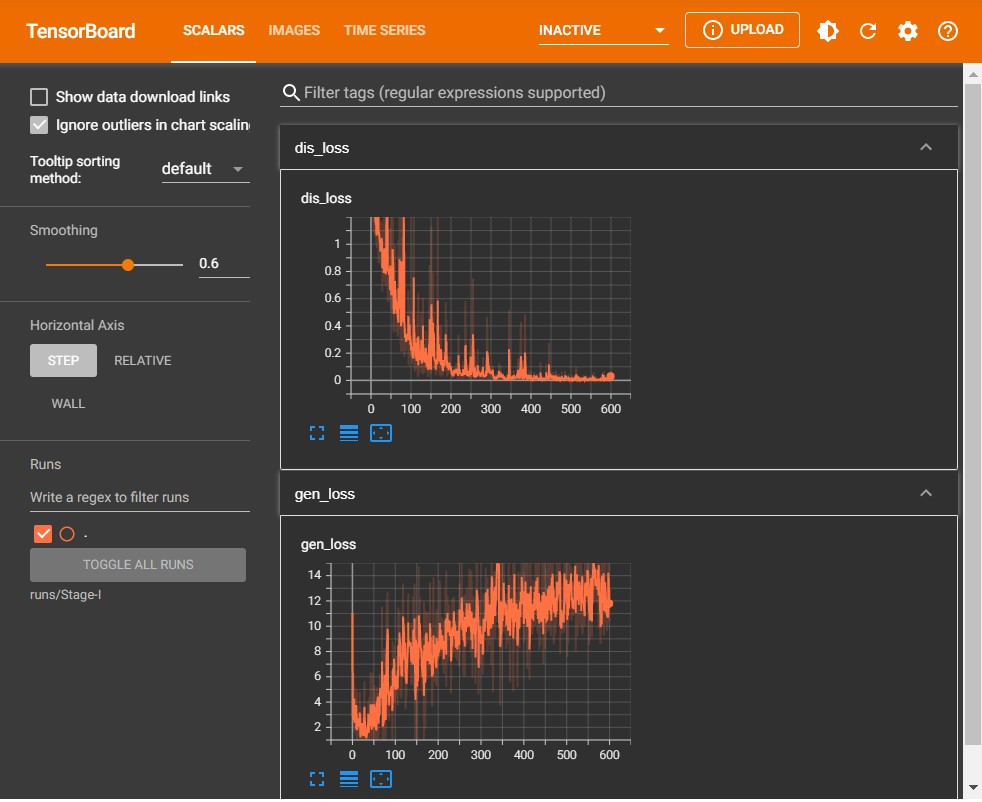

### Results Generated at Stage I

#### Epoch 0

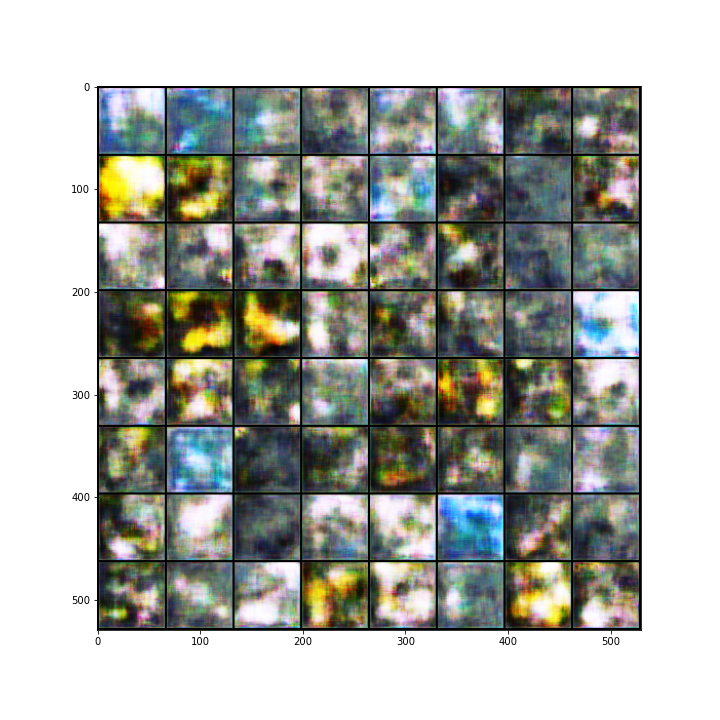

#### Epoch 300

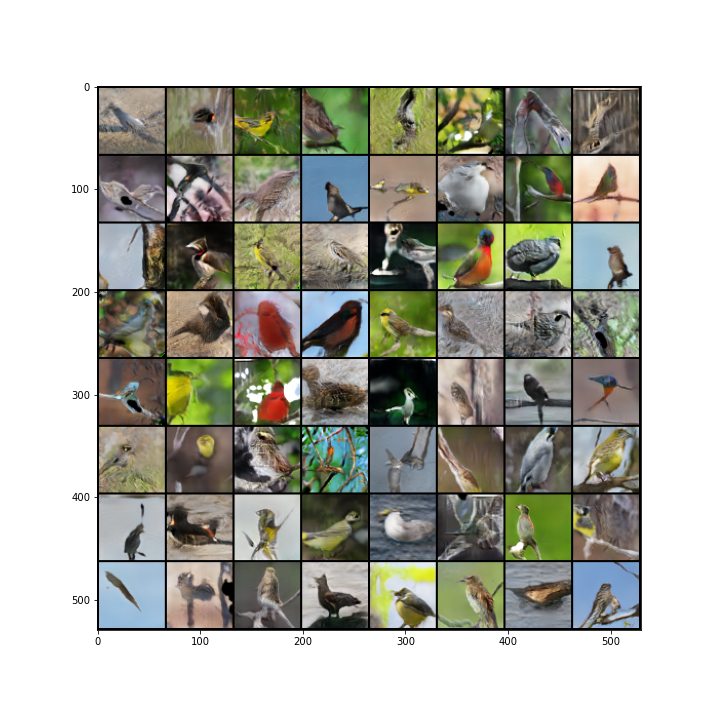

#### Epoch 600

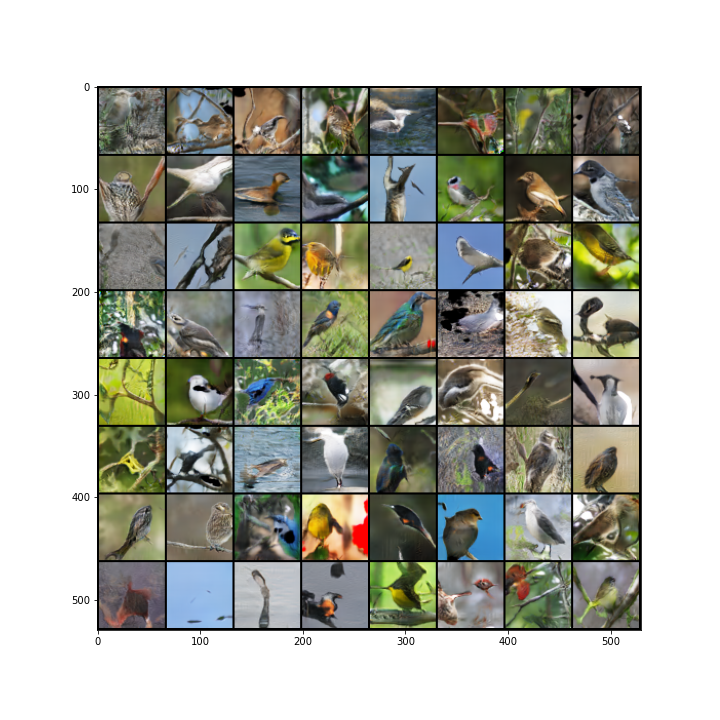

## 4.2 Stage 2 GAN

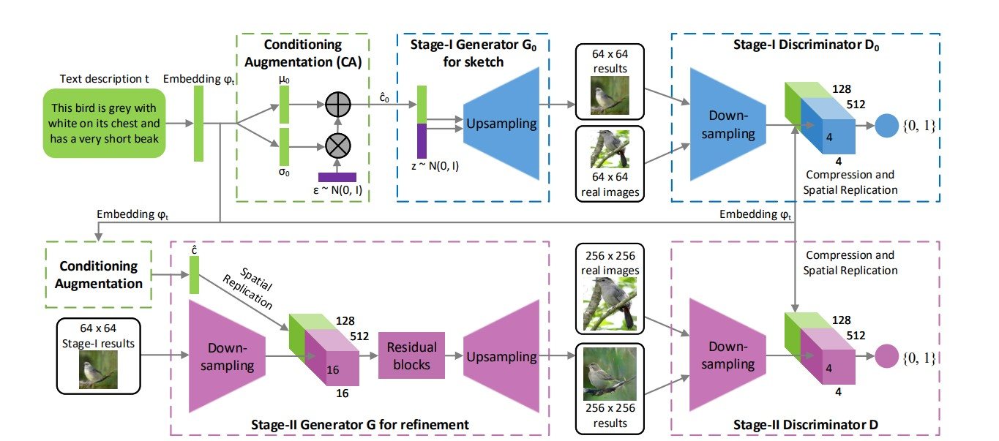

### Building Stage - 2 Generator

We design Stage-II generator as an encoder-decoder network with residual blocks.Similar to the previous stage, the text embedding ϕt is used to generate the Ng dimensional text conditioning vector c, which is spatially replicated to form a Mg×Mg×Ng tensor. Meanwhile, the Stage-I result s0 generated by Stage-I GAN is fed into several down-sampling blocks (i.e., encoder) until it has a spatial size of Mg × Mg. The image features and the text features are concatenated along the channel dimension. The encoded image features coupled with text features are fed into several residual blocks, which are designed to learn multi-modal representations across image and text features.  Finally, a series of up-sampling layers (i.e., decoder) are used to generate a W ×H high-resolution image. Such a generator is able to help rectify defects in the input image while add more details to generate the realistic high-resolution image.

In [7]:
class ResBlock(nn.Module):
    def __init__(self, plane):
        super(ResBlock, self).__init__()
        self.block = nn.Sequential(
            Conv_k3(plane, plane),
            nn.BatchNorm2d(plane),
            nn.ReLU(True),
            Conv_k3(plane, plane),
            nn.BatchNorm2d(plane)
        )
        self.relu = nn.ReLU(True)
        
    def forward(self, x):
        tmp = x
        o = self.block(x)
        o = o + tmp
        return self.relu(o)
    
class G_Stage2(nn.Module):
    def __init__(self, G_Stage1):
        super(G_Stage2, self).__init__()
        self.G1 = G_Stage1
        self.CA = CondAugment_Model()
        for p in self.G1.parameters():
            p.requires_grad = False
        self.encoder = nn.Sequential(
            Conv_k3(3, 128),
            nn.ReLU(True),
            nn.Conv2d(128, 128 * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128 * 2),
            nn.ReLU(True),
            nn.Conv2d(128 * 2, 128 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128 * 4),
            nn.ReLU(True))
        self.combine = nn.Sequential(
            Conv_k3(640, 512),
            nn.BatchNorm2d(512),
            nn.ReLU(True)
        )
        self.residual = nn.Sequential(
            ResBlock(512),
            ResBlock(512),
            ResBlock(512),
            ResBlock(512)
        )
        self.decoder = nn.Sequential(
            Upblock(512,256),
            Upblock(256,128),
            Upblock(128,64),
            Upblock(64,32),
            Conv_k3(32,3),
            nn.Tanh()
        )
        
    def forward(self, noise, emb):
        init_image, _, _ = self.G1(noise, emb)
        encoded = self.encoder(init_image)
        
        cond, m, s = self.CA(emb)
        cond = cond.view(-1, 128, 1, 1)
        cond = cond.repeat(1, 1, 16, 16)
        
        encoded_cond = torch.cat([encoded, cond],1)
        img_feature = self.combine(encoded_cond)
        img_feature = self.residual(img_feature)
        img = self.decoder(img_feature)
        
        return init_image, img, m, s

### Building Stage - 2 Discriminator

For the discriminator, its structure is similar to that of Stage-I discriminator with only extra down-sampling blocks since the
image size is larger in this stage. To explicitly enforce GAN to learn better alignment between the image and the conditioning 
text.  During training, the discriminator takes real images and their corresponding text descriptions as positive sample pairs, whereas negative sample pairs consist of two groups. The first is real images with mismatched text embeddings, while the second is synthetic images with their corresponding text embeddings.

In [8]:
class D_Stage2(nn.Module):
    def __init__(self):
        super(D_Stage2, self).__init__()
        self.img_encoder = nn.Sequential(
            # start 3 x 256 x 256
            nn.Conv2d(3, 128, 4, 2, 1, bias=False), #=> 128 x 128 x 128
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(128, 256, 4, 2, 1, bias=False), #=> 256 x 64 x 64
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(256, 512, 4, 2, 1, bias=False), #=> 512 x 32 x 32
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(512, 1024, 4, 2, 1, bias=False), #=> 1024 x 16 x 16
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(1024, 2048, 4, 2, 1, bias=False), #=> 2048 x 8 x 8
            nn.BatchNorm2d(2048),
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(2048, 4096, 4, 2, 1, bias=False), #=> 4096 x 4 x 4
            nn.BatchNorm2d(4096),
            nn.LeakyReLU(0.2, True),
            
            Conv_k3(4096, 2048), # 2048 x 4 x 4
            nn.BatchNorm2d(2048),
            nn.LeakyReLU(0.2, True),
            Conv_k3(2048, 1024), # 1024 x 4 x 4
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, True)
        )
        
        self.condition_classifier = D_output()
        self.uncondition_classifier = D_output(have_cond=False)
        
    def forward(self, img):
        img_feature = self.img_encoder(img)
        return img_feature

### Training Stage 2 GAN

In [1]:
%load_ext tensorboard

In [ ]:
def main():
    device = torch.device('cuda:0')
    # load dataset with size 256x256
    batch_size = 55
    transform = transforms.Compose([
                transforms.RandomCrop(256),
                transforms.RandomHorizontalFlip(),
                transforms.ToTensor(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    
    writer = SummaryWriter('runs/Stage-II')
    
    dataset = BirdDataset(dataDir = 'Data/', split='train', transform=transform, imgSize=256)
    tr_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)
    #load model Stage-I generator and put it into Stage-II generator
    G1 = G_Stage1()
    G1.load_state_dict(torch.load('results1/netG_epoch_600.pth'))
    G1.eval()
    netG = G_Stage2(G1).to(device)
    netG.apply(weights_init)
    netD = D_Stage2().to(device)
    netD.apply(weights_init)

    lr = 0.0002
    optD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
    # remove the parameter from Stage-I generator
    netG_param = []
    for p in netG.parameters():
        if p.requires_grad:
            netG_param.append(p)
    optG = optim.Adam(netG_param, lr=lr, betas=(0.5, 0.999))

    fixed_noise = torch.rand(batch_size, 100, 1, 1).to(device)

    real_labels = (torch.FloatTensor(batch_size).fill_(1)).to(device)
    fake_labels = (torch.FloatTensor(batch_size).fill_(0)).to(device)
    
    if not (os.path.isdir('results2/')):
        os.makedirs(imageDir)
    num_epoch = 450
    iters = 0
    for epoch in range(num_epoch+1):
        if epoch % 100 == 0 and epoch > 0:
            lr = lr*0.5
            for param_group in optG.param_groups:
                param_group['lr'] = lr
            for param_group in optD.param_groups:
                param_group['lr'] = lr
        for i, data in enumerate(tr_loader,0):
            real_imgs, encoded_caps = data
            real_imgs = real_imgs.to(device)
            encoded_caps = encoded_caps.to(device)

            ##update discriminator
            netD.zero_grad()
            # generate fake image
            noise = torch.rand(batch_size, 100, 1, 1).to(device)
            init_img ,fake_imgs, m, s = netG(noise, encoded_caps)
            errD, errD_real, errD_wrong, errD_fake = cal_D_loss(netD, real_imgs, fake_imgs, real_labels, fake_labels, m)
            errD.backward()
            optD.step()

            ##update generator
            netG.zero_grad()
            errG = cal_G_loss(netD, fake_imgs, real_labels, m)
            errG += errG + KL_loss(m,s)
            errG.backward()
            optG.step()
            
            writer.add_scalar("gen_loss",errG,epoch)
            writer.add_scalar("disc_loss",errD,epoch)          
            
            if i%50 == 0:
                 print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tLoss_D_R: %.4f\tLoss_D_W: %.4f\tLoss_D_F %.4f'
                      % (epoch, num_epoch, i, len(tr_loader),
                         errD.item(), errG.item(), errD_real, errD_wrong, errD_fake))
        if epoch%10==0:
            with torch.no_grad():
                _, fake, _, _  = netG(fixed_noise, encoded_caps)
                fig = plt.figure(figsize=(10,10))
                grid = make_grid(fake.detach().cpu(), nrow=8, normalize=True).permute(1,2,0).numpy()
                plt.imshow(grid)
                writer.add_image("fake",vutils.make_grid(fake[:64],normalize=True),epoch)
                fig.savefig('results2/epch-{}.png'.format(epoch))
                
        if epoch%15==0:
            torch.save(netG.state_dict(), 'results2/netG2_epoch_{}.pth'.format(epoch))
    torch.save(netD.state_dict(), 'results2/netD2_epoch_last.pth')

if __name__ == '__main__':
    main()

Load filenames from: Data/birds/train/filenames.pickle (8855)
captions shape:  (8855, 10, 1024)
Sequential(
  (0): Conv2d(1152, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): LeakyReLU(negative_slope=0.2, inplace=True)
  (3): Conv2d(1024, 1, kernel_size=(4, 4), stride=(4, 4))
  (4): Sigmoid()
)
Sequential(
  (0): Conv2d(1024, 1, kernel_size=(4, 4), stride=(4, 4))
  (1): Sigmoid()
)
[0/450][0/161]	Loss_D: 2.2295	Loss_G: 123.0124	Loss_D_R: 0.8095	Loss_D_W: 1.7088	Loss_D_F 1.2755
[0/450][50/161]	Loss_D: 1.2904	Loss_G: 3.1082	Loss_D_R: 0.6277	Loss_D_W: 0.6329	Loss_D_F 0.6775
[0/450][100/161]	Loss_D: 1.2828	Loss_G: 6.8375	Loss_D_R: 0.3903	Loss_D_W: 1.0054	Loss_D_F 0.8360
[0/450][150/161]	Loss_D: 1.3142	Loss_G: 6.0573	Loss_D_R: 0.7397	Loss_D_W: 0.5973	Loss_D_F 0.5630
[1/450][0/161]	Loss_D: 1.2914	Loss_G: 5.7026	Loss_D_R: 0.5806	Loss_D_W: 0.6090	Loss_D_F 0.7618
[1/450][50/161]

In [2]:
%tensorboard --logdir='runs/Stage-II'

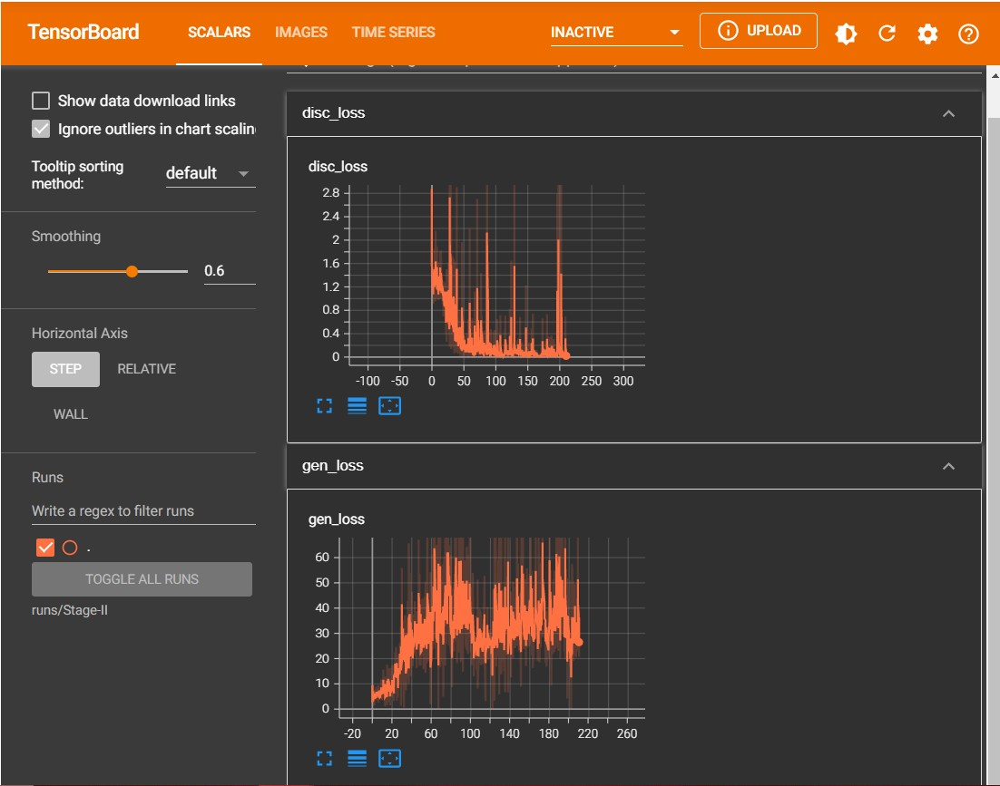

### Results Generated at Stage-II

#### Epoch 0

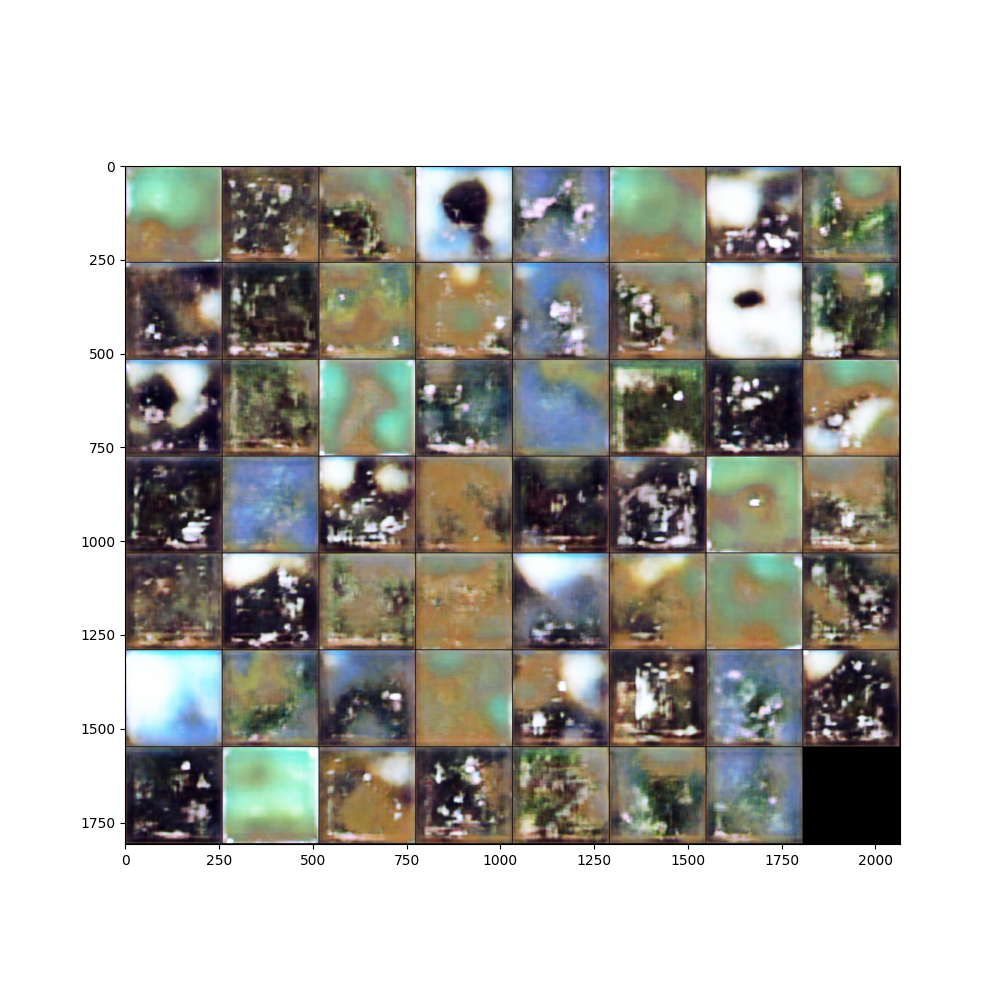

#### Epoch 300

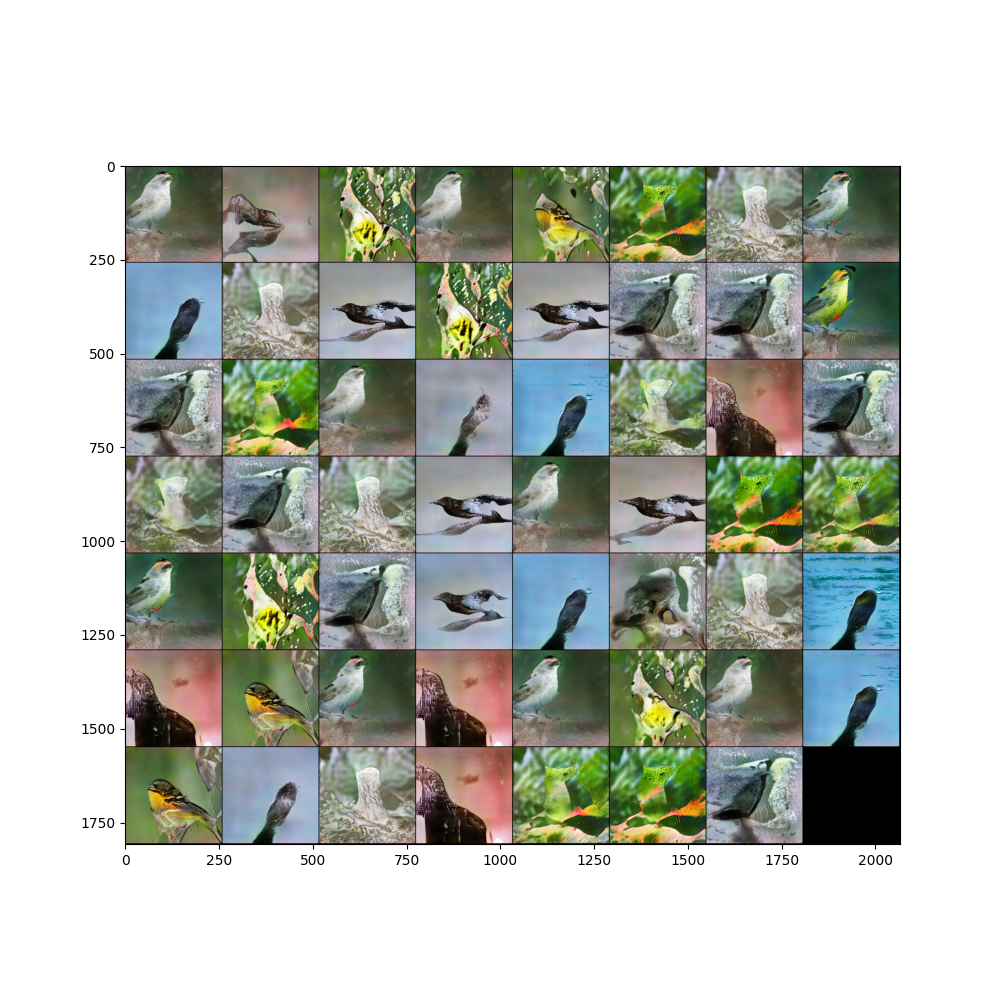

#### Epoch 450

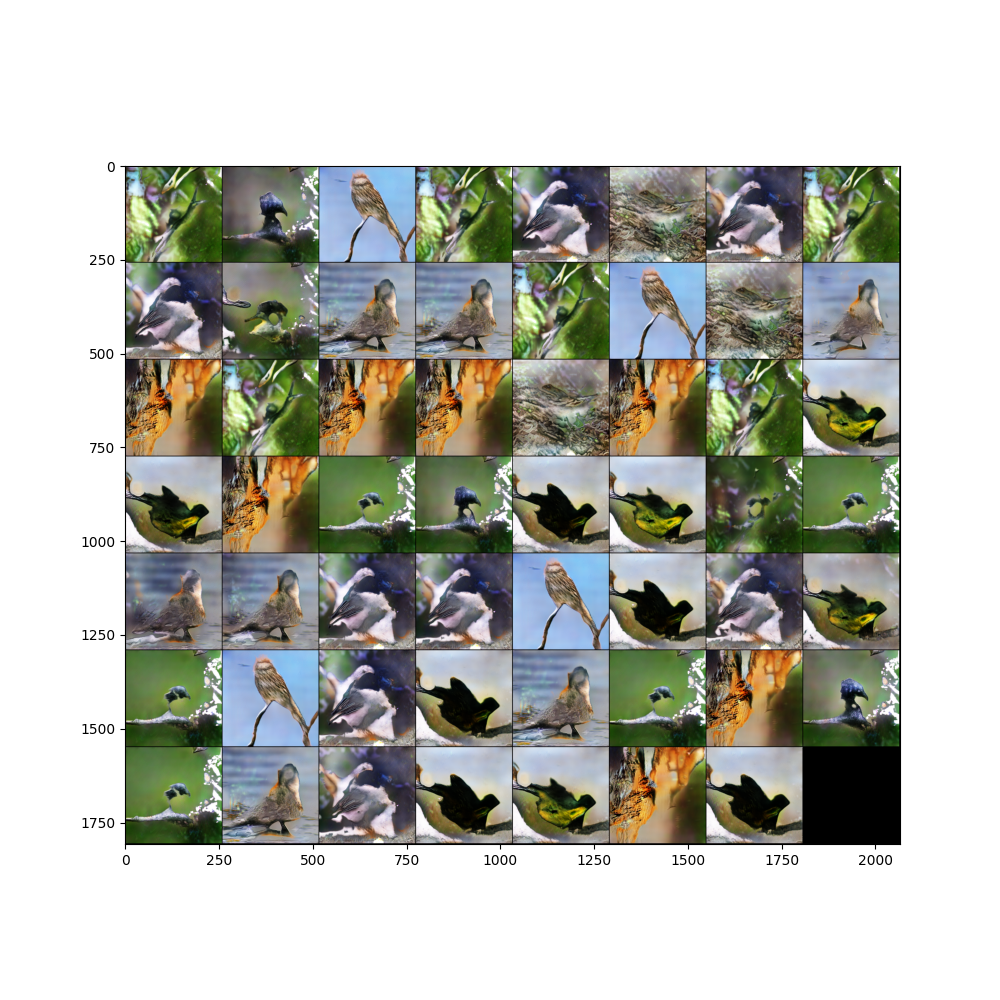

## 5. Real Images V/S Fake Images Generated on Test dataset

In [14]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
G1 = G_Stage1().to(device)
G1checkpoint = torch.load('results1/netG_epoch_600.pth')
G1.load_state_dict(G1checkpoint)
G1.eval()

netG = G_Stage2(G1).to(device)
G2checkpoint = torch.load('results2/netG2_epoch_450.pth')
netG.load_state_dict(G2checkpoint)
netG.eval()

G_Stage2(
  (G1): G_Stage1(
    (CA): CondAugment_Model(
      (fc): Linear(in_features=1024, out_features=256, bias=True)
      (relu): ReLU(inplace=True)
    )
    (fc): Sequential(
      (0): Linear(in_features=228, out_features=16384, bias=False)
      (1): BatchNorm1d(16384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (img): Sequential(
      (0): Upblock(
        (up): Upsample(scale_factor=2.0, mode=nearest)
        (conv): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (batch): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      )
      (1): Upblock(
        (up): Upsample(scale_factor=2.0, mode=nearest)
        (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (batch): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu)

In [15]:
transform = transforms.Compose([
                transforms.RandomCrop(256),
                transforms.RandomHorizontalFlip(),
                transforms.ToTensor(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    

    
dataset = BirdDataset(dataDir = 'Data/', split='test', transform=transform, imgSize=256)
te_loader = DataLoader(dataset, batch_size= 55, shuffle=True, drop_last=True)

Load filenames from: Data/birds/test/filenames.pickle (2933)
captions shape:  (2933, 10, 1024)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


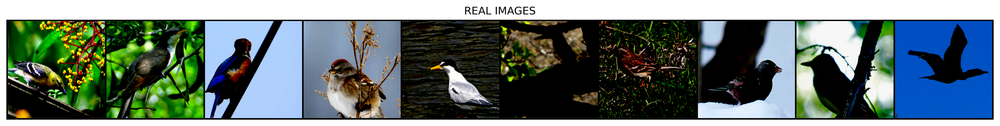

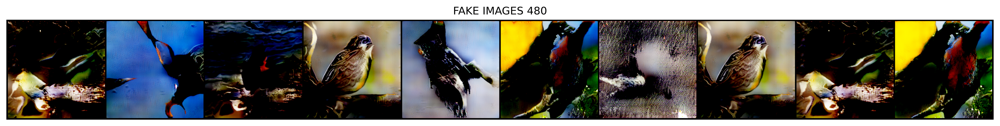

In [108]:
%matplotlib inline
te_loader = iter(te_loader)
imgTensor, captions = next(te_loader)

batch_size = 55
 
with torch.no_grad():# Generate image grid
    grid1 = make_grid(imgTensor[:10], padding = 4, nrow=10)

# Permute the axis as numpy expects image of shape (H x W x C) 
    grid1 = grid1.permute(1, 2, 0)

    plt.figure(figsize=(20, 8), dpi=300)
    plt.axis('off')
    plt.title('REAL IMAGES') 
    # Plot Image Grid
    plt.imshow(grid1)

with torch.no_grad():
    noise = torch.rand(batch_size, z_dim, 1, 1).to(device)
    cap = captions.to(device)
    init_imgs, fake_imgs, m, s = netG(noise, cap)

    # Generate image grid
    grid2 = make_grid(fake_imgs.detach().cpu()[:10], padding = 4, nrow=10).permute(1, 2, 0).numpy()

    plt.figure(figsize=(20, 8), dpi=300)
    plt.axis('off')
    plt.title('FAKE IMAGES 480')
    # Plot Image Grid
    plt.imshow(grid2)

### Observation

1. Our Model is able to generate the images of sparrow which is not as compelling as the original images but it has fulfilled the task.



2. The images generated are blury and missed the details this is because of low batch size and lesser number of epochs trained.
